In [2]:
import torch
import torch.utils.data as data
import torchvision as tv
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
import copy

### Lets load the date and examine it a little

In [3]:
transforms = tv.transforms.Compose([tv.transforms.ToTensor(), tv.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
dataset = tv.datasets.ImageFolder(root="./data/trafic_32", transform=transforms)

class_numbers = {i: 0 for i in range(43)}
img_shapes = set()

for img, label in dataset:
    class_numbers[label] += 1
    img_shapes.add(img.shape)

print(class_numbers)
print(len(dataset))
print(img_shapes)

{0: 210, 1: 2220, 2: 2250, 3: 1410, 4: 1980, 5: 1860, 6: 420, 7: 1440, 8: 1410, 9: 1470, 10: 2010, 11: 1320, 12: 2100, 13: 2160, 14: 780, 15: 630, 16: 420, 17: 1110, 18: 1200, 19: 210, 20: 360, 21: 330, 22: 390, 23: 510, 24: 270, 25: 1500, 26: 600, 27: 240, 28: 540, 29: 270, 30: 450, 31: 780, 32: 240, 33: 689, 34: 420, 35: 1200, 36: 390, 37: 210, 38: 2070, 39: 300, 40: 360, 41: 240, 42: 240}
39209
{torch.Size([3, 32, 32])}


Dataset is a little imbalanced. There are 43 different image classes. All images have size 32x32 and 3 channel.

### Splitting data and creating dataloaders

In [4]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

train_ds, valid_ds, test_ds = data.random_split(dataset=dataset, lengths=[27447, 5881, 5881], generator=torch.Generator().manual_seed(42))

BATCH = 128

train_dl  = data.DataLoader(train_ds, batch_size=BATCH, shuffle=True, drop_last=True, pin_memory=True)
valid_dl  = data.DataLoader(valid_ds, batch_size=BATCH, pin_memory=True)
test_dl  = data.DataLoader(test_ds, batch_size=BATCH, pin_memory=True)

# GAN

### Convolutional generator network definition

In [5]:
CLASSES_NUMBER = 43
ACT_FN_GEN = nn.ReLU
EMB = 16
CHANNELS_GEN = [256, 128, 64]


class Generator(nn.Module):
    def __init__(self) -> None:
        super().__init__()
        self.linear = nn.Sequential(
            nn.Linear(EMB + CLASSES_NUMBER, 16*CHANNELS_GEN[0]),
            nn.BatchNorm1d(16*CHANNELS_GEN[0]),
            ACT_FN_GEN(),
        )
        self.net = nn.Sequential(
            nn.ConvTranspose2d(CHANNELS_GEN[0], CHANNELS_GEN[1], kernel_size=3, output_padding=1, padding=1, stride=2), # 4x4 => 8x8
            nn.BatchNorm2d(CHANNELS_GEN[1]),
            ACT_FN_GEN(),

            nn.ConvTranspose2d(CHANNELS_GEN[1], CHANNELS_GEN[2], kernel_size=3, output_padding=1, padding=1, stride=2), # 8x8 => 16x16
            nn.BatchNorm2d(CHANNELS_GEN[2]),
            ACT_FN_GEN(),

            nn.ConvTranspose2d(CHANNELS_GEN[2], 3, kernel_size=3, output_padding=1, padding=1, stride=2), # 16x16 => 32x32
            nn.Tanh() # The input images is scaled between -1 and 1, hence the output has to be bounded as well
        )

    def forward(self, x, label):
        x = torch.concat((x, label), dim=-1)
        x = self.linear(x)
        x = x.reshape(x.shape[0], -1, 4, 4)
        x = self.net(x)
        return x

### Convolutional discriminator network definition

In [6]:
ACT_FN_DIS = nn.LeakyReLU(0.2, inplace=True)
CHANNELS_DIS = [3, 16, 32, 64, 128]
LIN = [512 + CLASSES_NUMBER, 1]

class Discriminator(nn.Module):
    def __init__(self) -> None:
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(CHANNELS_DIS[0], CHANNELS_DIS[1], kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(CHANNELS_DIS[1]),
            ACT_FN_DIS,

            nn.Conv2d(CHANNELS_DIS[1], CHANNELS_DIS[2], kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(CHANNELS_DIS[2]),
            ACT_FN_DIS,

            nn.Conv2d(CHANNELS_DIS[2], CHANNELS_DIS[3], kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(CHANNELS_DIS[3]),
            ACT_FN_DIS,

            nn.Conv2d(CHANNELS_DIS[3], CHANNELS_DIS[4], kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(CHANNELS_DIS[4]),
            ACT_FN_DIS,
        )
        self.linear = nn.Sequential(
            nn.Linear(LIN[0], LIN[1])
        )
    
    def forward(self, x, label):
        x = self.net(x)
        x = torch.flatten(x, start_dim=1)
        x = torch.concat((x, label), dim=-1)
        x = self.linear(x)
        return x

In [8]:
# Models

generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Following models - idea borrowed form Reinforcement learning and Actor-Critic methods
# generator_following = copy.deepcopy(generator)
# discriminator_following = copy.deepcopy(discriminator)

# Optimizers
generator_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0001, betas=(0.5, 0.999))
generator_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer=generator_optimizer, gamma=0.99)
discriminator_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0001, betas=(0.5, 0.999))
discriminator_scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer=discriminator_optimizer, gamma=0.99)

# loss
criterion = nn.MSELoss()


fixed_noise = torch.randn(16, EMB, device=device)
fixed_classes = torch.randint(0, 43, (16,1)).to(device)
fixed_classes = torch.squeeze(fixed_classes, dim=-1)
fixed_classes = nn.functional.one_hot(fixed_classes, CLASSES_NUMBER)

### Training the model

Epoch: 0, discrimiantor fake error: 0.237, discriminator real acc: 0.778


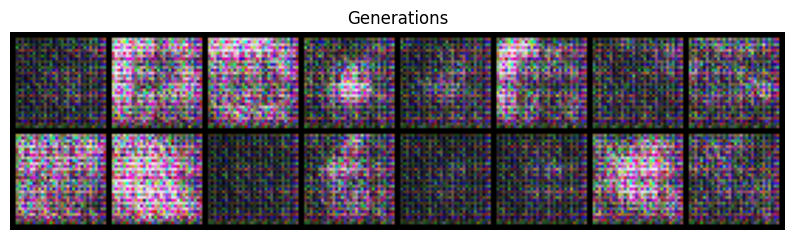

Epoch: 1, discrimiantor fake error: 0.313, discriminator real acc: 0.679
Epoch: 2, discrimiantor fake error: 0.289, discriminator real acc: 0.702
Epoch: 3, discrimiantor fake error: 0.286, discriminator real acc: 0.708
Epoch: 4, discrimiantor fake error: 0.291, discriminator real acc: 0.707
Epoch: 5, discrimiantor fake error: 0.304, discriminator real acc: 0.693


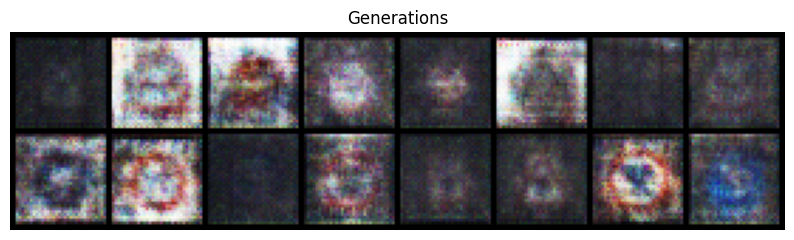

Epoch: 6, discrimiantor fake error: 0.313, discriminator real acc: 0.684
Epoch: 7, discrimiantor fake error: 0.307, discriminator real acc: 0.691
Epoch: 8, discrimiantor fake error: 0.297, discriminator real acc: 0.701
Epoch: 9, discrimiantor fake error: 0.284, discriminator real acc: 0.714
Epoch: 10, discrimiantor fake error: 0.265, discriminator real acc: 0.731


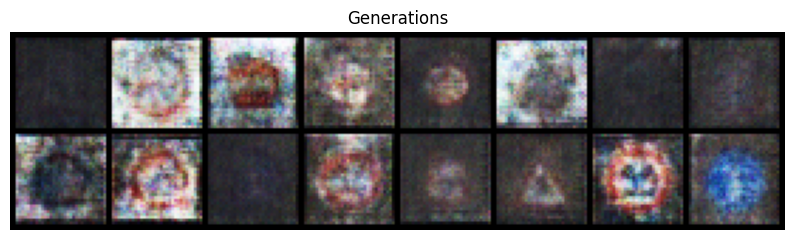

Epoch: 11, discrimiantor fake error: 0.25, discriminator real acc: 0.749
Epoch: 12, discrimiantor fake error: 0.238, discriminator real acc: 0.76
Epoch: 13, discrimiantor fake error: 0.223, discriminator real acc: 0.775
Epoch: 14, discrimiantor fake error: 0.215, discriminator real acc: 0.783
Epoch: 15, discrimiantor fake error: 0.205, discriminator real acc: 0.793


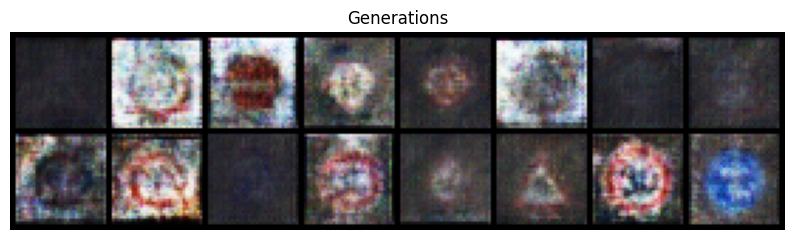

Epoch: 16, discrimiantor fake error: 0.194, discriminator real acc: 0.804
Epoch: 17, discrimiantor fake error: 0.186, discriminator real acc: 0.812
Epoch: 18, discrimiantor fake error: 0.182, discriminator real acc: 0.817
Epoch: 19, discrimiantor fake error: 0.173, discriminator real acc: 0.825
Epoch: 20, discrimiantor fake error: 0.173, discriminator real acc: 0.825


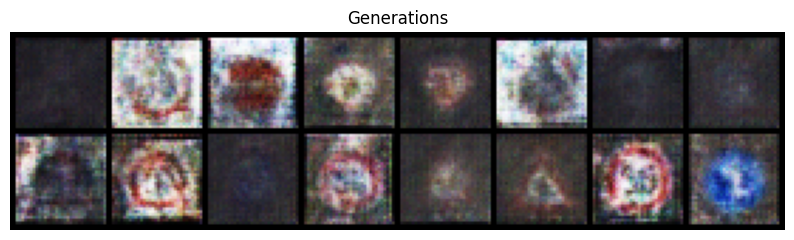

Epoch: 21, discrimiantor fake error: 0.163, discriminator real acc: 0.836
Epoch: 22, discrimiantor fake error: 0.158, discriminator real acc: 0.84
Epoch: 23, discrimiantor fake error: 0.153, discriminator real acc: 0.847
Epoch: 24, discrimiantor fake error: 0.157, discriminator real acc: 0.841
Epoch: 25, discrimiantor fake error: 0.15, discriminator real acc: 0.85


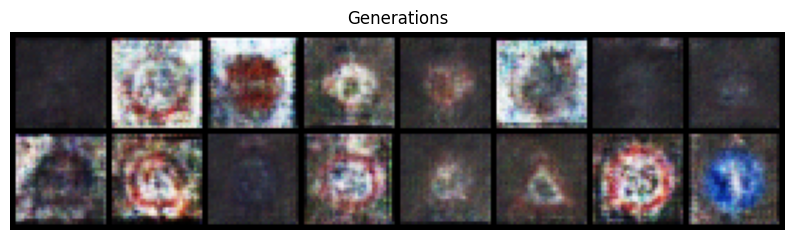

Epoch: 26, discrimiantor fake error: 0.148, discriminator real acc: 0.849
Epoch: 27, discrimiantor fake error: 0.147, discriminator real acc: 0.854
Epoch: 28, discrimiantor fake error: 0.142, discriminator real acc: 0.858
Epoch: 29, discrimiantor fake error: 0.139, discriminator real acc: 0.859
Epoch: 30, discrimiantor fake error: 0.134, discriminator real acc: 0.864


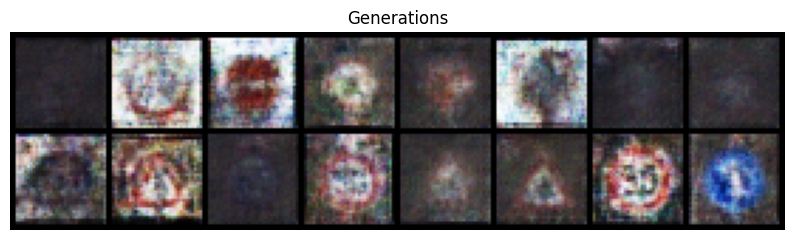

Epoch: 31, discrimiantor fake error: 0.143, discriminator real acc: 0.857
Epoch: 32, discrimiantor fake error: 0.134, discriminator real acc: 0.864
Epoch: 33, discrimiantor fake error: 0.129, discriminator real acc: 0.87
Epoch: 34, discrimiantor fake error: 0.134, discriminator real acc: 0.866
Epoch: 35, discrimiantor fake error: 0.129, discriminator real acc: 0.871


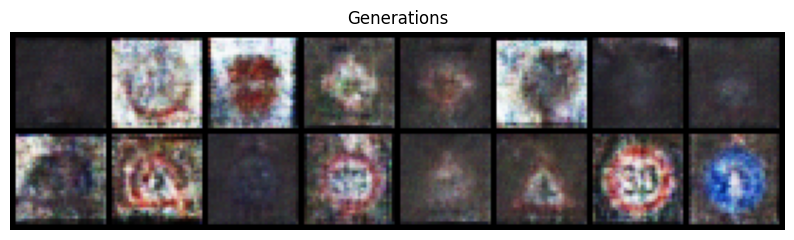

Epoch: 36, discrimiantor fake error: 0.127, discriminator real acc: 0.873
Epoch: 37, discrimiantor fake error: 0.119, discriminator real acc: 0.88
Epoch: 38, discrimiantor fake error: 0.124, discriminator real acc: 0.876
Epoch: 39, discrimiantor fake error: 0.121, discriminator real acc: 0.879
Epoch: 40, discrimiantor fake error: 0.118, discriminator real acc: 0.881


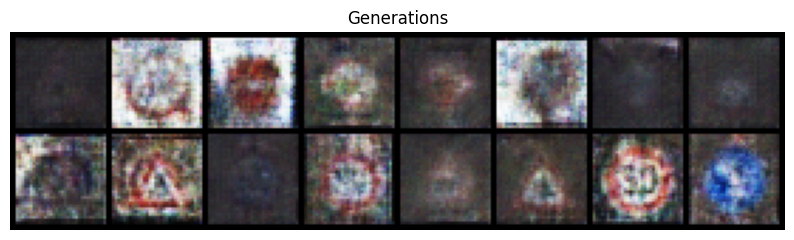

Epoch: 41, discrimiantor fake error: 0.124, discriminator real acc: 0.875
Epoch: 42, discrimiantor fake error: 0.122, discriminator real acc: 0.876
Epoch: 43, discrimiantor fake error: 0.116, discriminator real acc: 0.884
Epoch: 44, discrimiantor fake error: 0.115, discriminator real acc: 0.885
Epoch: 45, discrimiantor fake error: 0.112, discriminator real acc: 0.887


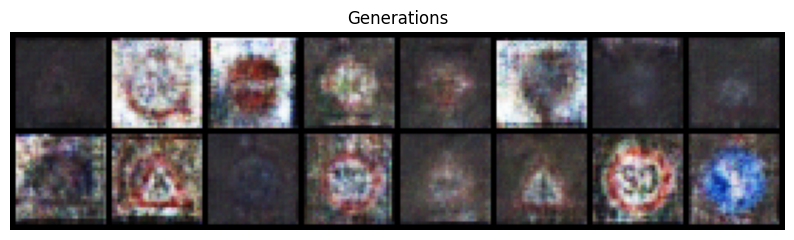

Epoch: 46, discrimiantor fake error: 0.113, discriminator real acc: 0.887
Epoch: 47, discrimiantor fake error: 0.114, discriminator real acc: 0.884
Epoch: 48, discrimiantor fake error: 0.112, discriminator real acc: 0.888
Epoch: 49, discrimiantor fake error: 0.108, discriminator real acc: 0.892
Epoch: 50, discrimiantor fake error: 0.105, discriminator real acc: 0.893


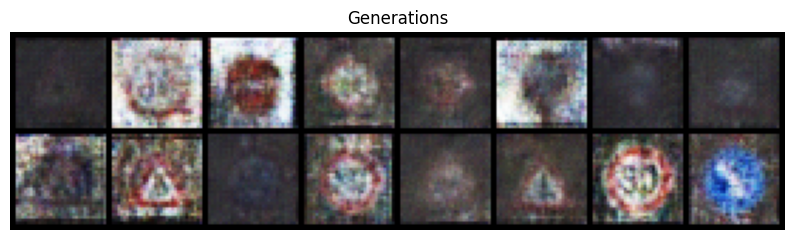

Epoch: 51, discrimiantor fake error: 0.109, discriminator real acc: 0.891
Epoch: 52, discrimiantor fake error: 0.109, discriminator real acc: 0.891
Epoch: 53, discrimiantor fake error: 0.107, discriminator real acc: 0.893
Epoch: 54, discrimiantor fake error: 0.101, discriminator real acc: 0.899
Epoch: 55, discrimiantor fake error: 0.102, discriminator real acc: 0.898


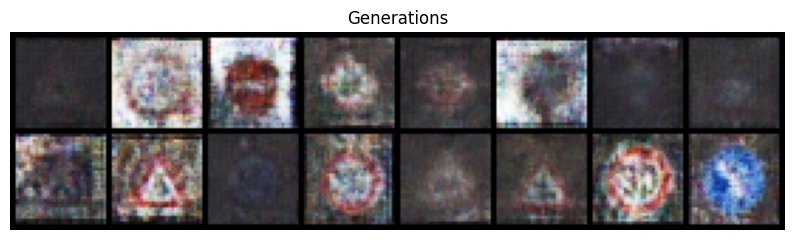

Epoch: 56, discrimiantor fake error: 0.0995, discriminator real acc: 0.899
Epoch: 57, discrimiantor fake error: 0.102, discriminator real acc: 0.9
Epoch: 58, discrimiantor fake error: 0.105, discriminator real acc: 0.894
Epoch: 59, discrimiantor fake error: 0.0958, discriminator real acc: 0.904
Epoch: 60, discrimiantor fake error: 0.103, discriminator real acc: 0.898


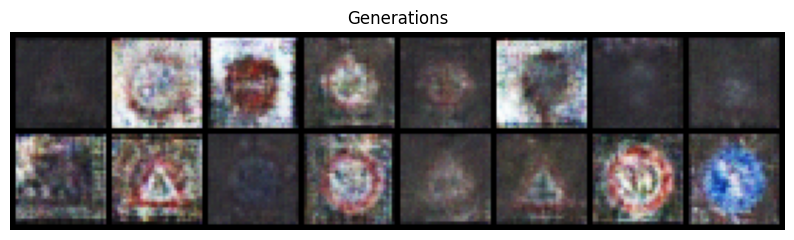

Epoch: 61, discrimiantor fake error: 0.0978, discriminator real acc: 0.902
Epoch: 62, discrimiantor fake error: 0.0991, discriminator real acc: 0.9
Epoch: 63, discrimiantor fake error: 0.101, discriminator real acc: 0.898
Epoch: 64, discrimiantor fake error: 0.0962, discriminator real acc: 0.904
Epoch: 65, discrimiantor fake error: 0.0916, discriminator real acc: 0.908


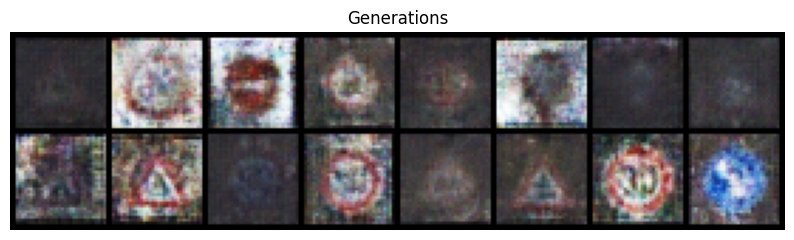

Epoch: 66, discrimiantor fake error: 0.0952, discriminator real acc: 0.904
Epoch: 67, discrimiantor fake error: 0.0957, discriminator real acc: 0.904
Epoch: 68, discrimiantor fake error: 0.0986, discriminator real acc: 0.902
Epoch: 69, discrimiantor fake error: 0.0891, discriminator real acc: 0.91
Epoch: 70, discrimiantor fake error: 0.0918, discriminator real acc: 0.907


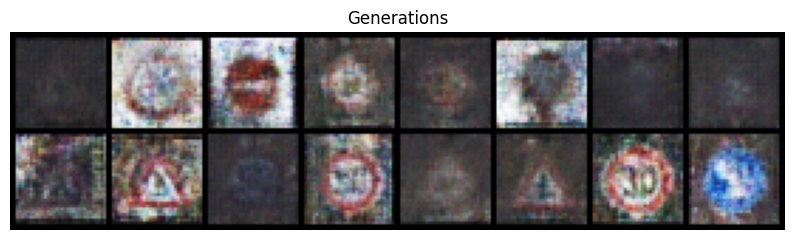

Epoch: 71, discrimiantor fake error: 0.0955, discriminator real acc: 0.905
Epoch: 72, discrimiantor fake error: 0.09, discriminator real acc: 0.91
Epoch: 73, discrimiantor fake error: 0.0915, discriminator real acc: 0.908
Epoch: 74, discrimiantor fake error: 0.089, discriminator real acc: 0.911
Epoch: 75, discrimiantor fake error: 0.0928, discriminator real acc: 0.907


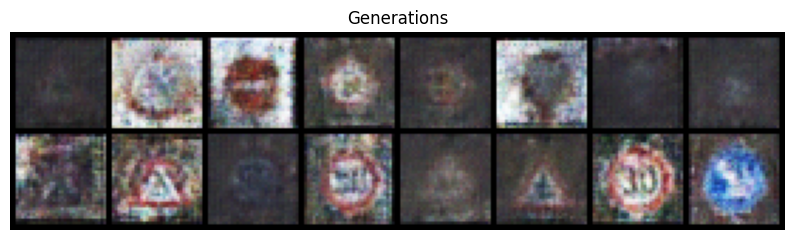

Epoch: 76, discrimiantor fake error: 0.0868, discriminator real acc: 0.913
Epoch: 77, discrimiantor fake error: 0.0931, discriminator real acc: 0.907
Epoch: 78, discrimiantor fake error: 0.0905, discriminator real acc: 0.91
Epoch: 79, discrimiantor fake error: 0.0878, discriminator real acc: 0.912
Epoch: 80, discrimiantor fake error: 0.0861, discriminator real acc: 0.914


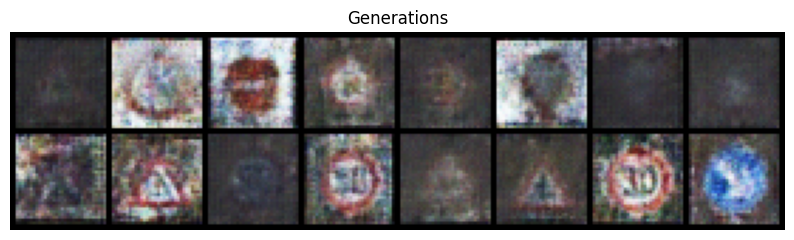

Epoch: 81, discrimiantor fake error: 0.0868, discriminator real acc: 0.915
Epoch: 82, discrimiantor fake error: 0.085, discriminator real acc: 0.914
Epoch: 83, discrimiantor fake error: 0.084, discriminator real acc: 0.915
Epoch: 84, discrimiantor fake error: 0.0849, discriminator real acc: 0.915
Epoch: 85, discrimiantor fake error: 0.0867, discriminator real acc: 0.914


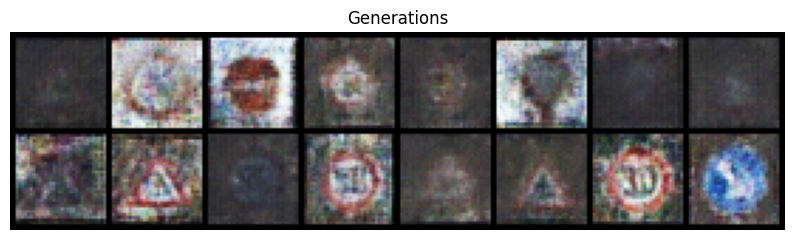

Epoch: 86, discrimiantor fake error: 0.0824, discriminator real acc: 0.918
Epoch: 87, discrimiantor fake error: 0.0819, discriminator real acc: 0.918
Epoch: 88, discrimiantor fake error: 0.0875, discriminator real acc: 0.913
Epoch: 89, discrimiantor fake error: 0.0819, discriminator real acc: 0.917
Epoch: 90, discrimiantor fake error: 0.0841, discriminator real acc: 0.915


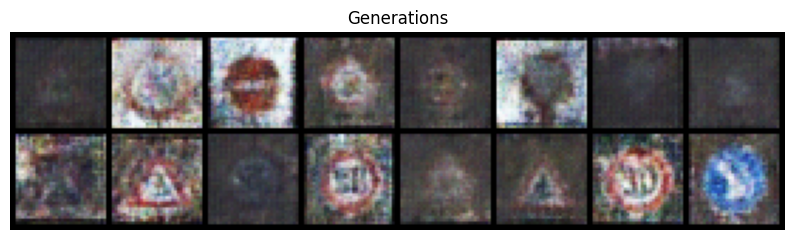

Epoch: 91, discrimiantor fake error: 0.0836, discriminator real acc: 0.917
Epoch: 92, discrimiantor fake error: 0.0807, discriminator real acc: 0.919
Epoch: 93, discrimiantor fake error: 0.0863, discriminator real acc: 0.915
Epoch: 94, discrimiantor fake error: 0.0804, discriminator real acc: 0.918
Epoch: 95, discrimiantor fake error: 0.0808, discriminator real acc: 0.919


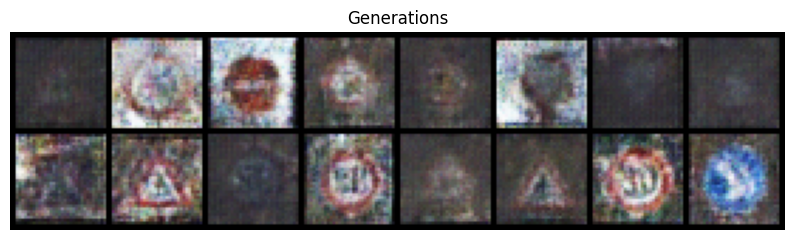

Epoch: 96, discrimiantor fake error: 0.0817, discriminator real acc: 0.919
Epoch: 97, discrimiantor fake error: 0.0759, discriminator real acc: 0.924
Epoch: 98, discrimiantor fake error: 0.0802, discriminator real acc: 0.919
Epoch: 99, discrimiantor fake error: 0.0777, discriminator real acc: 0.922
Epoch: 100, discrimiantor fake error: 0.0794, discriminator real acc: 0.921


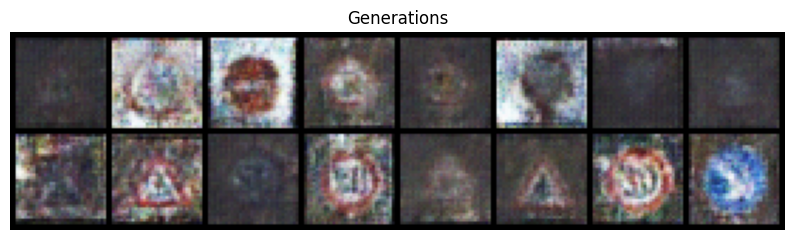

Epoch: 101, discrimiantor fake error: 0.0793, discriminator real acc: 0.92
Epoch: 102, discrimiantor fake error: 0.0804, discriminator real acc: 0.92
Epoch: 103, discrimiantor fake error: 0.0804, discriminator real acc: 0.919
Epoch: 104, discrimiantor fake error: 0.078, discriminator real acc: 0.923
Epoch: 105, discrimiantor fake error: 0.0759, discriminator real acc: 0.924


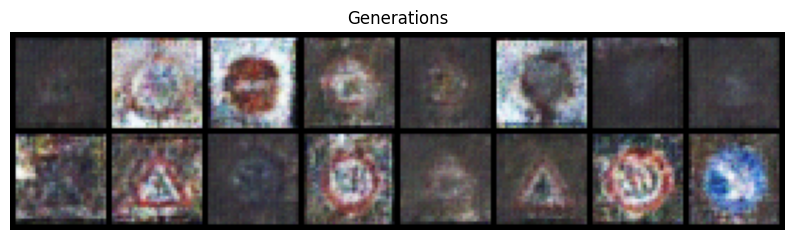

Epoch: 106, discrimiantor fake error: 0.0779, discriminator real acc: 0.922
Epoch: 107, discrimiantor fake error: 0.0751, discriminator real acc: 0.925
Epoch: 108, discrimiantor fake error: 0.0751, discriminator real acc: 0.925
Epoch: 109, discrimiantor fake error: 0.0763, discriminator real acc: 0.924
Epoch: 110, discrimiantor fake error: 0.0729, discriminator real acc: 0.925


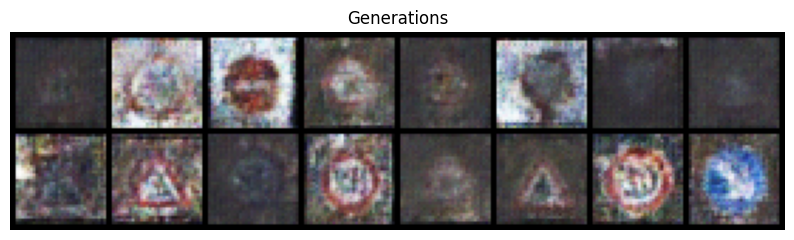

Epoch: 111, discrimiantor fake error: 0.0762, discriminator real acc: 0.924
Epoch: 112, discrimiantor fake error: 0.0742, discriminator real acc: 0.926
Epoch: 113, discrimiantor fake error: 0.077, discriminator real acc: 0.923
Epoch: 114, discrimiantor fake error: 0.0697, discriminator real acc: 0.931
Epoch: 115, discrimiantor fake error: 0.0752, discriminator real acc: 0.925


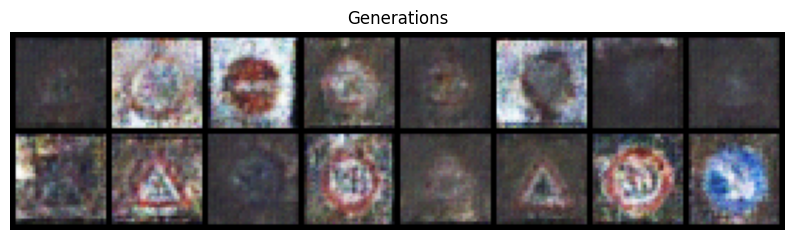

Epoch: 116, discrimiantor fake error: 0.0737, discriminator real acc: 0.926
Epoch: 117, discrimiantor fake error: 0.0689, discriminator real acc: 0.931
Epoch: 118, discrimiantor fake error: 0.0744, discriminator real acc: 0.926
Epoch: 119, discrimiantor fake error: 0.0746, discriminator real acc: 0.925
Epoch: 120, discrimiantor fake error: 0.0726, discriminator real acc: 0.927


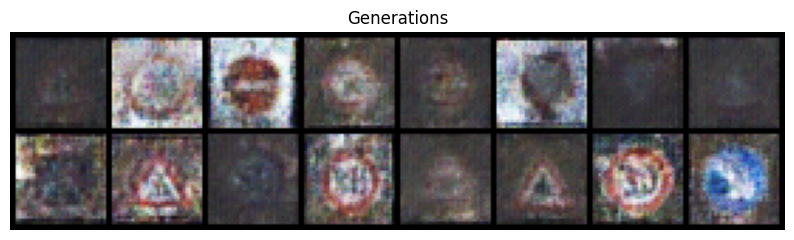

Epoch: 121, discrimiantor fake error: 0.0715, discriminator real acc: 0.928
Epoch: 122, discrimiantor fake error: 0.0737, discriminator real acc: 0.926
Epoch: 123, discrimiantor fake error: 0.0758, discriminator real acc: 0.925
Epoch: 124, discrimiantor fake error: 0.071, discriminator real acc: 0.93
Epoch: 125, discrimiantor fake error: 0.0705, discriminator real acc: 0.928


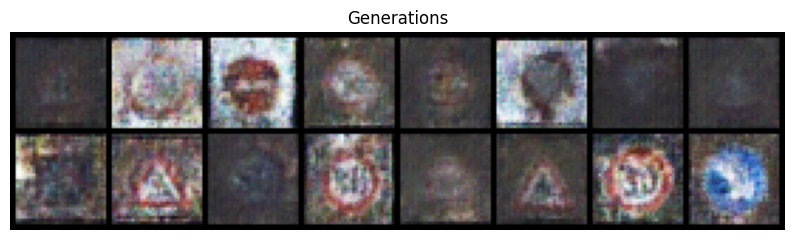

Epoch: 126, discrimiantor fake error: 0.0726, discriminator real acc: 0.927
Epoch: 127, discrimiantor fake error: 0.068, discriminator real acc: 0.933
Epoch: 128, discrimiantor fake error: 0.0729, discriminator real acc: 0.927
Epoch: 129, discrimiantor fake error: 0.069, discriminator real acc: 0.93
Epoch: 130, discrimiantor fake error: 0.0669, discriminator real acc: 0.933


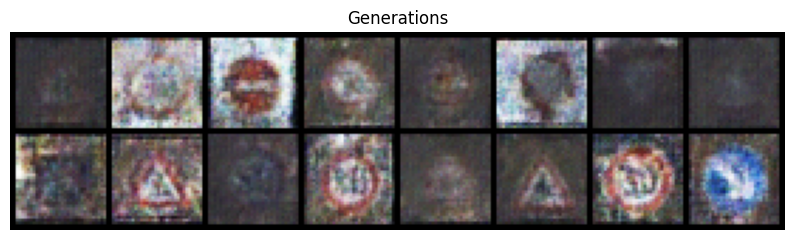

KeyboardInterrupt: 

In [10]:
G_losses = []
D_losses = []
num_epochs = 300
for epoch in range(num_epochs):
    # For each batch in the dataloader
    discriminator_fake_acc = []
    discriminator_real_acc = []
    for i, data in enumerate(train_dl, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        discriminator_optimizer.zero_grad()
        # Format batch
        real_images = data[0].to(device)
        img_class = data[1].to(device)
        img_class = nn.functional.one_hot(img_class, CLASSES_NUMBER)
        b_size = real_images.size(0)
        label = torch.ones((b_size,), dtype=torch.float, device=device) # Setting labels for real images
        # Forward pass real batch through D
        output = discriminator(real_images, img_class).view(-1)
        # Calculate loss on all-real batch
        error_discriminator_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        error_discriminator_real.backward()
        discriminator_real_acc.append(output.mean().item())

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, EMB, device=device)
        img_class = torch.randint(0, 43, (b_size, 1)).to(device)
        img_class = torch.squeeze(img_class, dim=-1)
        img_class = nn.functional.one_hot(img_class, CLASSES_NUMBER)
        # Generate fake image batch with Generator
        fake_images = generator(noise, img_class)
        label_fake = torch.zeros((b_size,), dtype=torch.float, device=device)
        # Classify all fake batch with Discriminator
        output = discriminator(fake_images.detach(), img_class).view(-1)
        # Calculate D's loss on the all-fake batch
        error_discriminator_fake = criterion(output, label_fake)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        error_discriminator_fake.backward()
        discriminator_fake_acc.append(output.mean().item())
        # Compute error of D as sum over the fake and the real batches
        error_discriminator = error_discriminator_real + error_discriminator_fake
        # Update D
        discriminator_optimizer.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        generator_optimizer.zero_grad()
        label = torch.ones((b_size,), dtype=torch.float, device=device)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = discriminator(fake_images, img_class).view(-1)
        # Calculate G's loss based on this output
        error_generator = criterion(output, label)
        # Calculate gradients for G
        error_generator.backward()
        D_G_z2 = output.mean().item()
        # Update G
        generator_optimizer.step()

        # Output training stats
        # Save Losses for plotting later
        G_losses.append(error_generator.item())
        D_losses.append(error_discriminator.item())

        # if i % 3 == 0:
        #     generator_following.load_state_dict(generator.state_dict())
        #     discriminator_following.load_state_dict(discriminator.state_dict())

    print(f"Epoch: {epoch}, discrimiantor fake error: {np.mean(discriminator_fake_acc):.3}, discriminator real acc: {np.mean(discriminator_real_acc):.3}")
    generator_scheduler.step()
    discriminator_scheduler.step()
    if epoch % 5 == 0:
        with torch.no_grad():
            fake = generator(fixed_noise, fixed_classes).detach().cpu()
        fake = (fake + 1) / 2
        grid = tv.utils.make_grid(fake)
        grid = grid.permute(1, 2, 0)
        plt.figure(figsize=(10,10))
        plt.title(f"Generations")
        plt.imshow(grid)
        plt.axis('off')
        plt.show()

### Well that's disappointing ...
The results are definitely not as good as expected. Despite changing hyperparameter, networks architecture and other tricks, our GAN is just not preforming well. The learning process is just to unstable. Let's try a different, more stable approach.

# VAE

### Convolutional encoder network

In [11]:
CLASS_NUMBER = 43
EMB = 512
ACT_FN_DIS = nn.LeakyReLU(0.2, inplace=True)
CHANNELS_DIS = [3, 32, 64, 128, 256]
LIN = [1024 + CLASS_NUMBER , EMB]

class Encoder(nn.Module):
    def __init__(self) -> None:
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(CHANNELS_DIS[0], CHANNELS_DIS[1], kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(CHANNELS_DIS[1]),
            ACT_FN_DIS,

            nn.Conv2d(CHANNELS_DIS[1], CHANNELS_DIS[2], kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(CHANNELS_DIS[2]),
            ACT_FN_DIS,

            nn.Conv2d(CHANNELS_DIS[2], CHANNELS_DIS[3], kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(CHANNELS_DIS[3]),
            ACT_FN_DIS,

            nn.Conv2d(CHANNELS_DIS[3], CHANNELS_DIS[4], kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(CHANNELS_DIS[4]),
            ACT_FN_DIS,
        )
        self.mean_fn = nn.Sequential(
            nn.Linear(LIN[0], LIN[1])
        )
        self.var_fn = nn.Sequential(
            nn.Linear(LIN[0], LIN[1])
        )
    
    def forward(self, x, label):
        x = self.net(x)
        x = torch.flatten(x, start_dim=1)
        x = torch.concat((x, label), dim=-1)
        mean = self.mean_fn(x)
        log_var = self.var_fn(x)
        return mean, log_var

### Convolutional decoder network

In [12]:
ACT_FN_GEN = nn.LeakyReLU(0.2)
CHANNELS_GEN = [256, 128, 64]


class Decoder(nn.Module):
    def __init__(self) -> None:
        super().__init__()
        self.linear = nn.Sequential(
            nn.Linear(EMB + CLASS_NUMBER, 16*CHANNELS_GEN[0]),
            nn.BatchNorm1d(16*CHANNELS_GEN[0]),
            ACT_FN_GEN,
        )
        self.net = nn.Sequential(
            nn.ConvTranspose2d(CHANNELS_GEN[0], CHANNELS_GEN[1], kernel_size=3, output_padding=1, padding=1, stride=2), # 4x4 => 8x8
            nn.BatchNorm2d(CHANNELS_GEN[1]),
            ACT_FN_GEN,

            nn.ConvTranspose2d(CHANNELS_GEN[1], CHANNELS_GEN[2], kernel_size=3, output_padding=1, padding=1, stride=2), # 8x8 => 16x16
            nn.BatchNorm2d(CHANNELS_GEN[2]),
            ACT_FN_GEN,

            nn.ConvTranspose2d(CHANNELS_GEN[2], 3, kernel_size=3, output_padding=1, padding=1, stride=2), # 16x16 => 32x32
            nn.Tanh() # The input images is scaled between -1 and 1, hence the output has to be bounded as well
        )

    def forward(self, x, label):
        x = torch.concat((x, label), dim=-1)
        x = self.linear(x)
        x = x.reshape(x.shape[0], -1, 4, 4)
        x = self.net(x)
        return x

### VAE network

In [13]:
class VAE(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()

        
    def reparameterization(self, mean, var):
        z = torch.normal(torch.zeros_like(mean), torch.ones_like(var))
        return mean + var * z
        
                
    def forward(self, x, y):
        mean, log_var = self.encoder(x, y)
        z = self.reparameterization(mean, torch.exp(0.5 * log_var)) # takes exponential function (log var -> var)
        x_hat = self.decoder(z, y)
        return x_hat, mean, log_var

In [14]:
def vae_loss_function(x, x_hat, mean, log_var):
    reproduction_loss = nn.functional.mse_loss(x_hat, x, reduction='sum')
    KLD      = -0.5 * torch.sum(1+ log_var - mean.pow(2) - log_var.exp())

    return reproduction_loss + KLD

In [38]:
def generate_images(model, n_imgs, device):
    # Generate images
    model.eval()
    with torch.no_grad():
        embeds = torch.randn([n_imgs, EMB], ).to(device)
        img_class = torch.randint(0, 43, (n_imgs, 1)).to(device)
        img_class = torch.squeeze(img_class, dim=-1)
        img_class = nn.functional.one_hot(img_class, CLASS_NUMBER)
        generated_imgs = model.decoder(embeds, img_class)
    generated_imgs = generated_imgs.cpu()
    
    grid = tv.utils.make_grid(generated_imgs, nrow=4, normalize=True, value_range=(-1,1))
    grid = grid.permute(1, 2, 0)

    plt.figure(figsize=(15,10))

    plt.title(f"Generations")
    plt.imshow(grid)
    plt.axis('off')
    plt.show()

### Training the model

In [36]:
vae = VAE().to(device)

criterion = nn.MSELoss(reduction="sum")
optimizer = torch.optim.Adam(vae.parameters(), lr=0.001)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer=optimizer, gamma=0.99)

Epoch 0 loss 25319.674448744157, test L1 = 0.14716349866079248


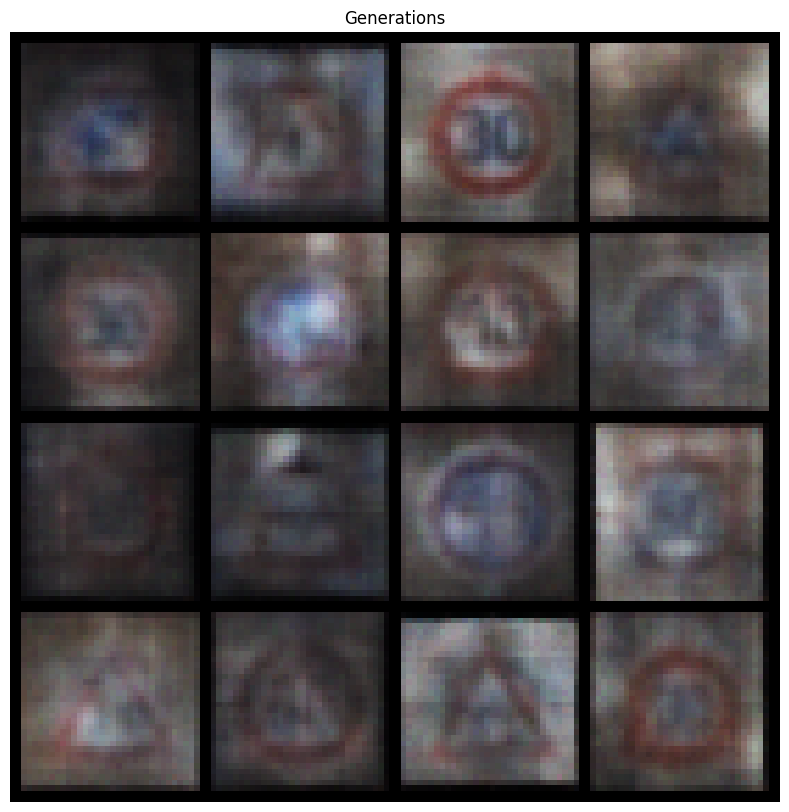

Epoch 1 loss 23167.683931439835, test L1 = 0.14000174532765927
Epoch 2 loss 21622.272488317758, test L1 = 0.1348240764244743
Epoch 3 loss 20489.339642961448, test L1 = 0.13288009733609532
Epoch 4 loss 19696.426849080024, test L1 = 0.12884666009441667
Epoch 5 loss 19073.74717983353, test L1 = 0.12575531524160635


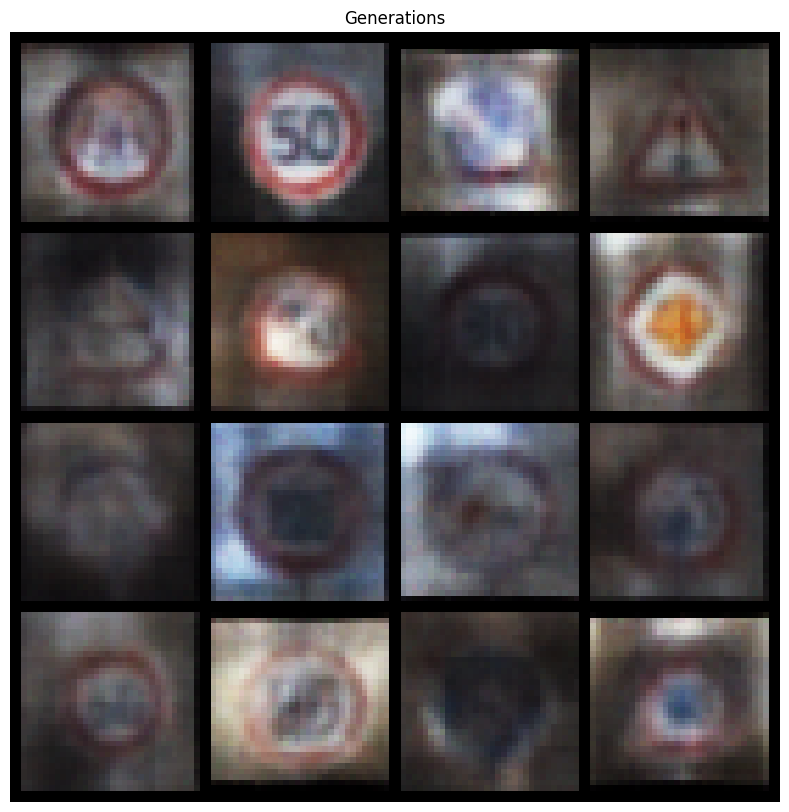

Epoch 6 loss 18601.620851891064, test L1 = 0.12429151522076648
Epoch 7 loss 18231.134236273363, test L1 = 0.12209994605054027
Epoch 8 loss 17887.047883506133, test L1 = 0.12198553542080133
Epoch 9 loss 17624.10586120035, test L1 = 0.12056302910913592
Epoch 10 loss 17297.39186623832, test L1 = 0.11959906537895618


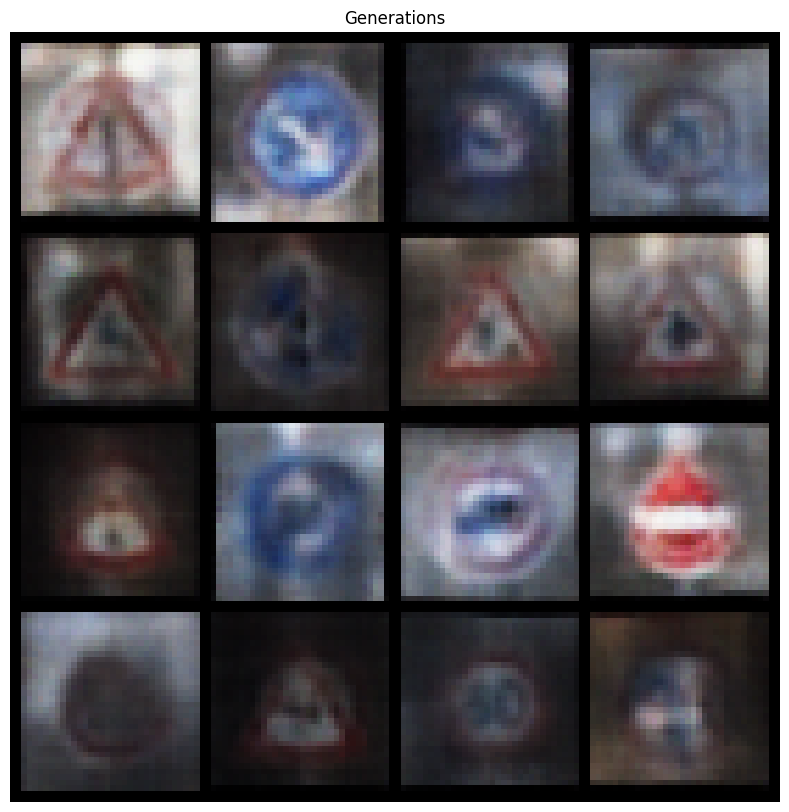

Epoch 11 loss 17024.937910703855, test L1 = 0.11781797817219859
Epoch 12 loss 16841.23569837909, test L1 = 0.11601185442312904
Epoch 13 loss 16692.566762193343, test L1 = 0.11612530311812526
Epoch 14 loss 16479.276955863024, test L1 = 0.11445378188205801
Epoch 15 loss 16322.040627738026, test L1 = 0.11447189440545828


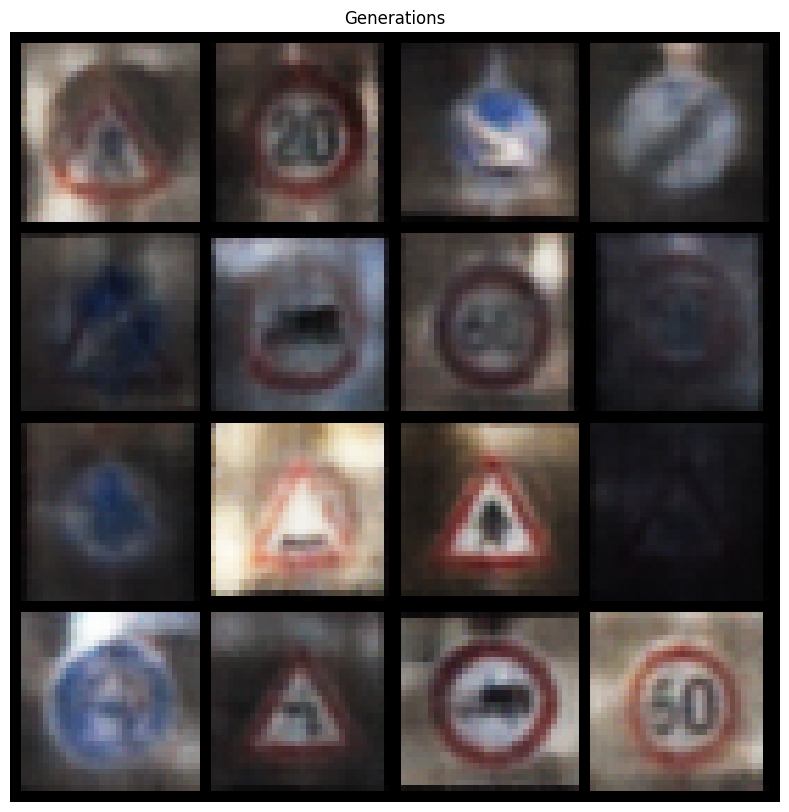

Epoch 16 loss 16123.75820495035, test L1 = 0.11342810531673224
Epoch 17 loss 15993.77095958674, test L1 = 0.11221746582051982
Epoch 18 loss 15842.137567537968, test L1 = 0.11157847374029782
Epoch 19 loss 15752.609548408294, test L1 = 0.11131446549425954
Epoch 20 loss 15580.938243830315, test L1 = 0.11131471363098724


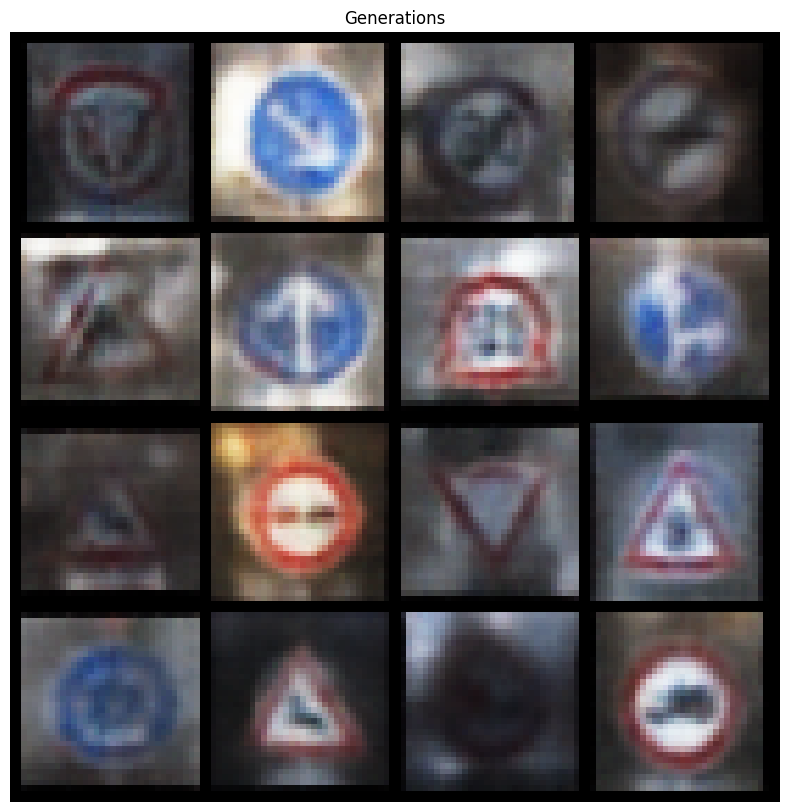

Epoch 21 loss 15470.703567647488, test L1 = 0.11235284562344136
Epoch 22 loss 15366.457957615363, test L1 = 0.11010904253824898
Epoch 23 loss 15245.599098276869, test L1 = 0.10938917667321536
Epoch 24 loss 15140.86038806951, test L1 = 0.10871351413104845
Epoch 25 loss 15029.408591011974, test L1 = 0.1094245917123297


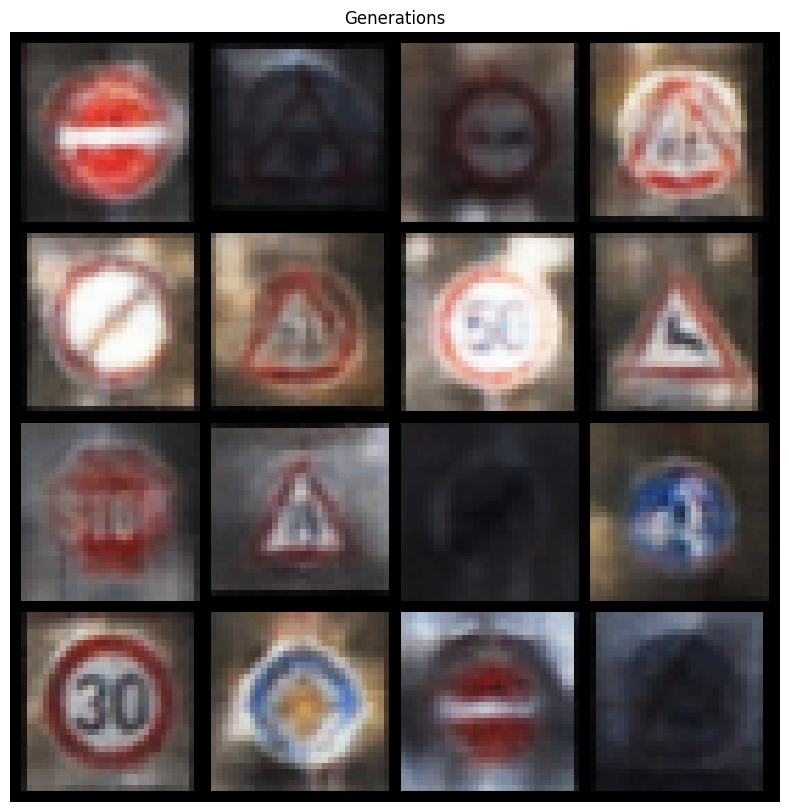

Epoch 26 loss 14996.53482312354, test L1 = 0.10879224895135216
Epoch 27 loss 14869.805563668224, test L1 = 0.10720753426785054
Epoch 28 loss 14777.967997042932, test L1 = 0.10705122367843338
Epoch 29 loss 14697.671948014018, test L1 = 0.10698760867766711
Epoch 30 loss 14674.341815128504, test L1 = 0.10740901529788971


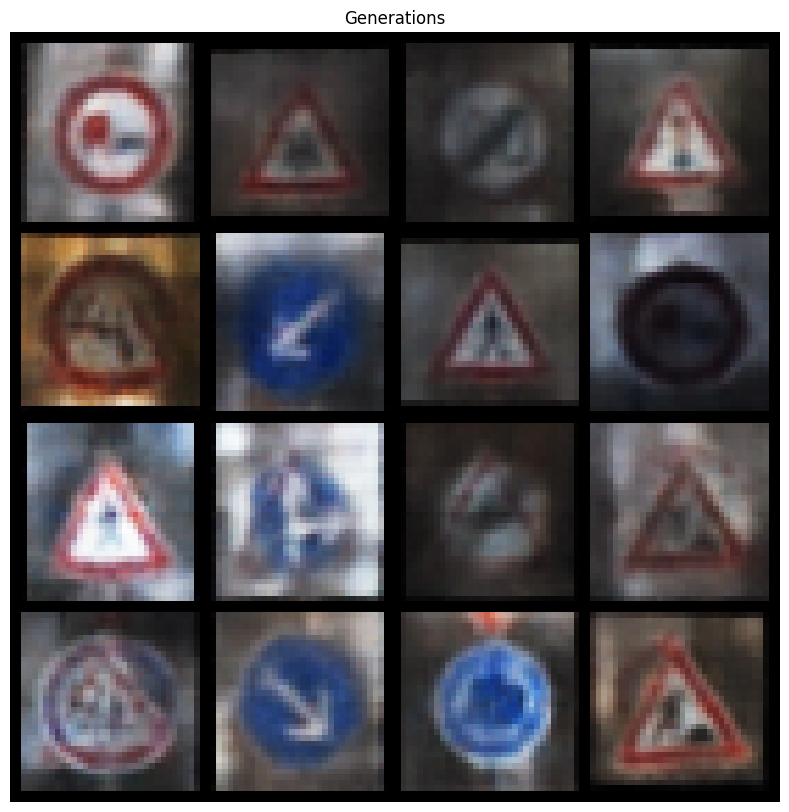

Epoch 31 loss 14576.372485579732, test L1 = 0.10669364844975264
Epoch 32 loss 14507.1569390698, test L1 = 0.10602210753637811
Epoch 33 loss 14429.949328271028, test L1 = 0.1061413780502651
Epoch 34 loss 14345.084563923774, test L1 = 0.10553271048094916
Epoch 35 loss 14290.28646593896, test L1 = 0.10469956323504448


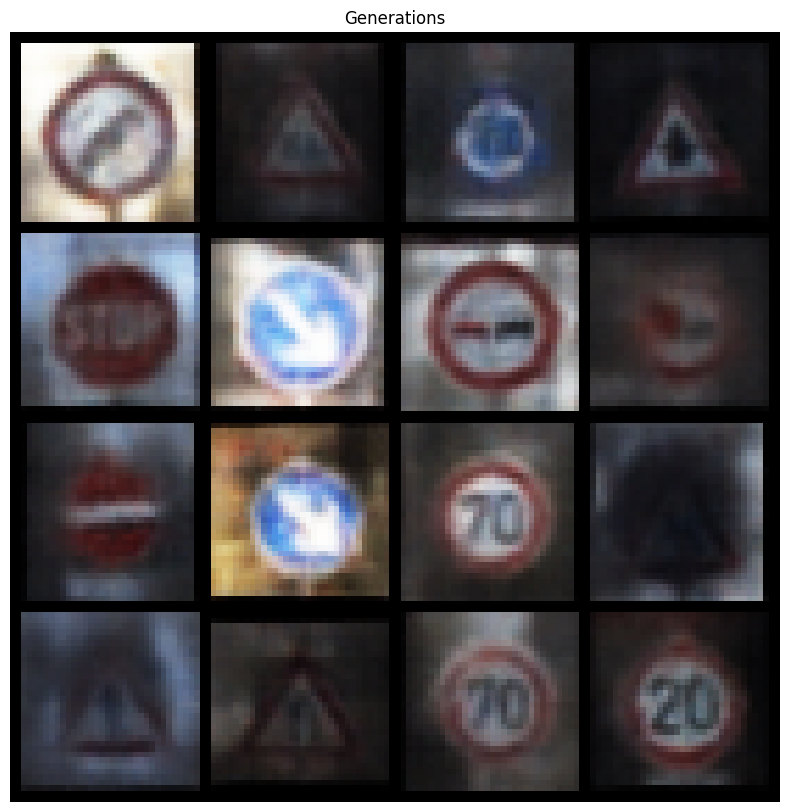

Epoch 36 loss 14242.047568633177, test L1 = 0.10665166701959528
Epoch 37 loss 14189.947594188085, test L1 = 0.10525360735862152
Epoch 38 loss 14149.381817683996, test L1 = 0.10461241573743198
Epoch 39 loss 14061.230560017524, test L1 = 0.10452484420460204
Epoch 40 loss 14021.028169721087, test L1 = 0.10359666723272075


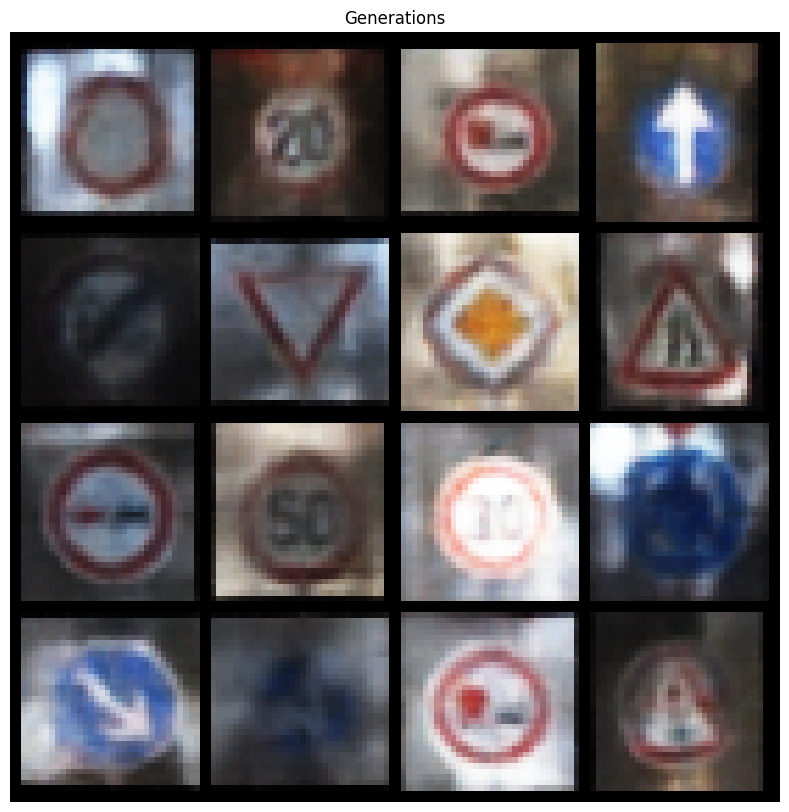

Epoch 41 loss 13971.73269567757, test L1 = 0.10341773489895074
Epoch 42 loss 13929.773921217873, test L1 = 0.10399687273994736
Epoch 43 loss 13887.836726964077, test L1 = 0.10343862001014792
Epoch 44 loss 13842.659476306952, test L1 = 0.1036709746264893
Epoch 45 loss 13768.423919392524, test L1 = 0.10344610330851181


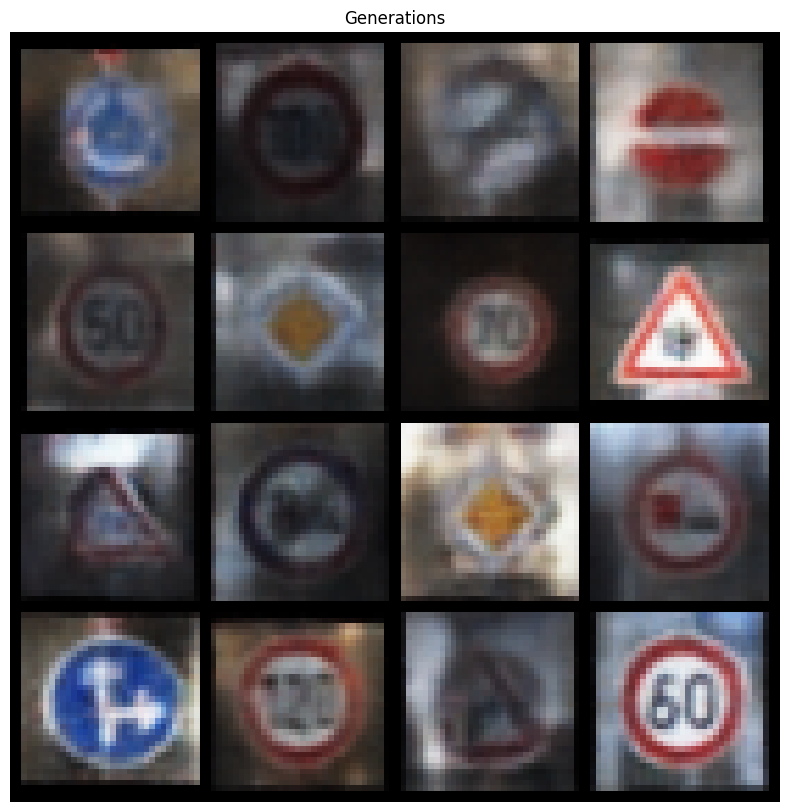

Epoch 46 loss 13752.226749598423, test L1 = 0.10329960205632707
Epoch 47 loss 13694.49075916326, test L1 = 0.10289143025875092
Epoch 48 loss 13656.75244140625, test L1 = 0.10257978688763536
Epoch 49 loss 13627.551935784171, test L1 = 0.10245371140215707
Epoch 50 loss 13578.533554504966, test L1 = 0.10300485158096188


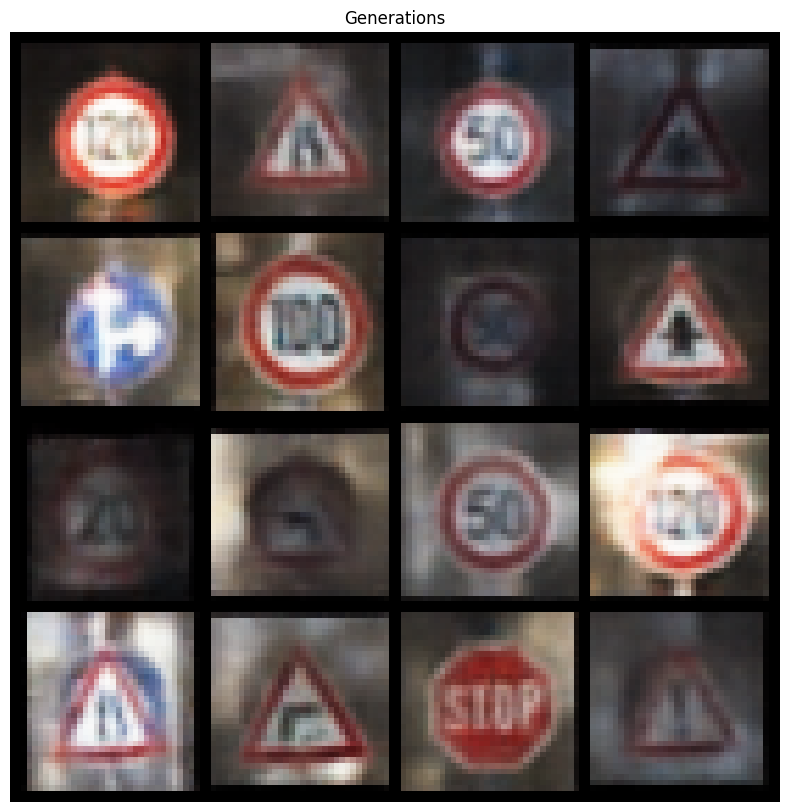

Epoch 51 loss 13563.404191917349, test L1 = 0.10286047439212384
Epoch 52 loss 13512.295930381133, test L1 = 0.10226584906163423
Epoch 53 loss 13478.110579731308, test L1 = 0.1022644949995953
Epoch 54 loss 13454.252455096379, test L1 = 0.10193615082813345
Epoch 55 loss 13430.992967837325, test L1 = 0.10211379615508992


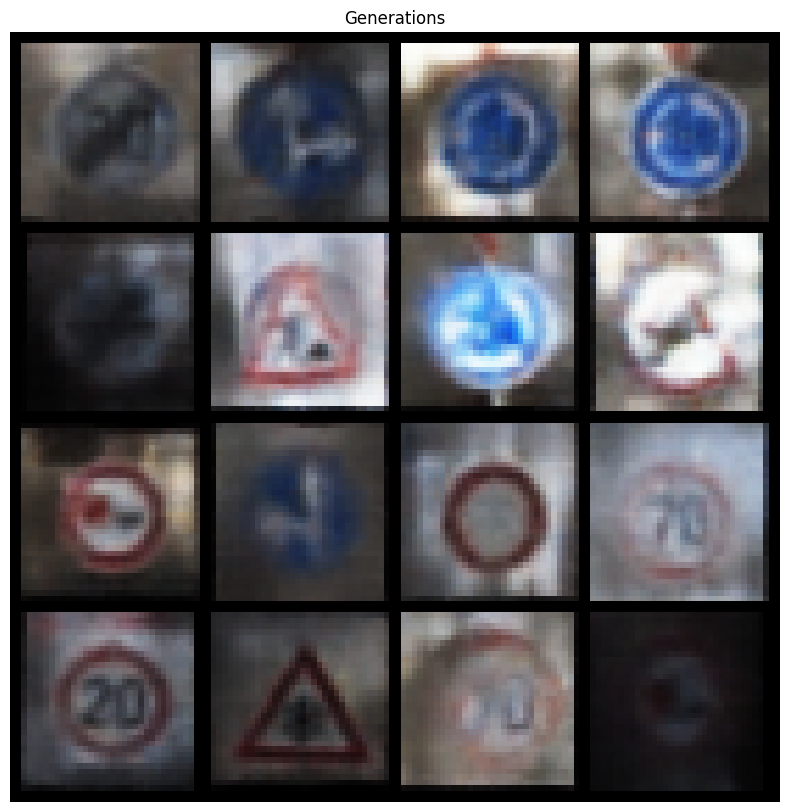

Epoch 56 loss 13352.026536032417, test L1 = 0.1026148624394251
Epoch 57 loss 13343.245769750292, test L1 = 0.10110109850116399
Epoch 58 loss 13305.324519932827, test L1 = 0.10127656842055528
Epoch 59 loss 13275.013297678153, test L1 = 0.1029701190798179
Epoch 60 loss 13254.239869304907, test L1 = 0.10135240885226623


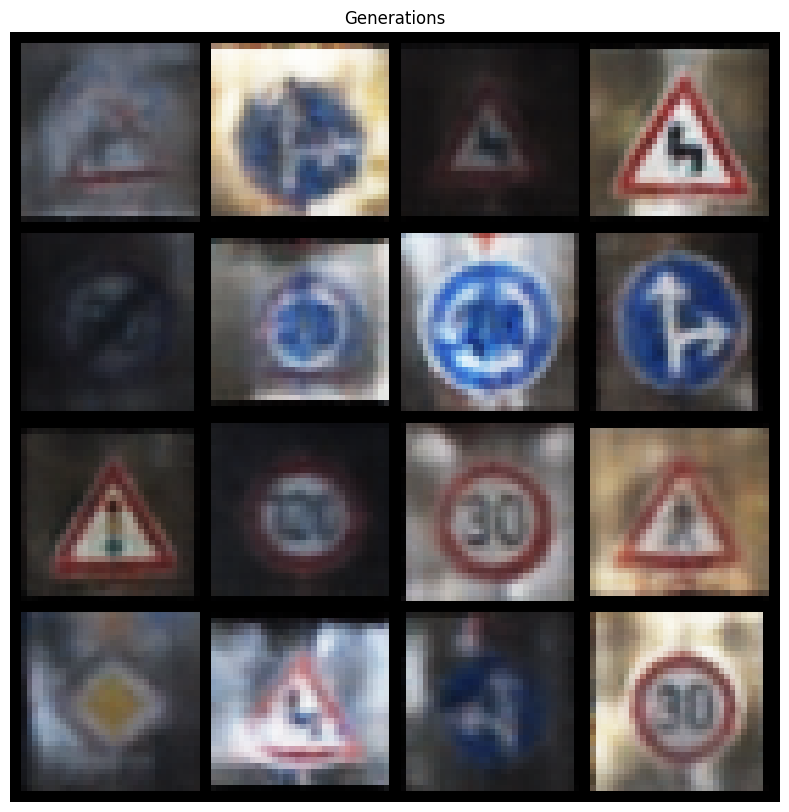

Epoch 61 loss 13220.843316479264, test L1 = 0.10122057374404825
Epoch 62 loss 13205.116945641063, test L1 = 0.10115175418879675
Epoch 63 loss 13166.500397013726, test L1 = 0.10061826184391975
Epoch 64 loss 13126.863002884054, test L1 = 0.10147681492178337
Epoch 65 loss 13110.250209915304, test L1 = 0.10100957492123479


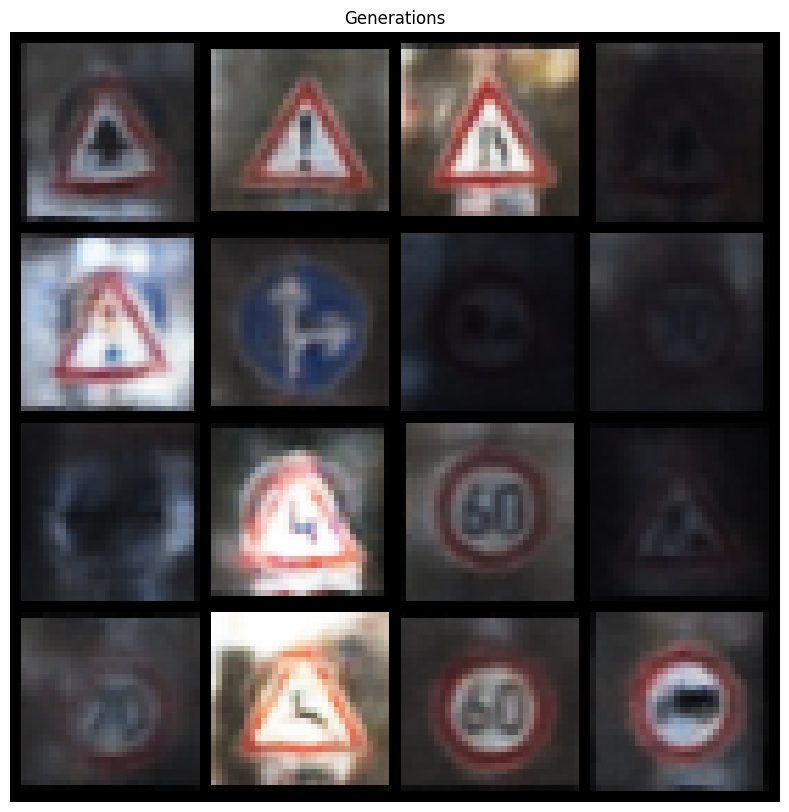

Epoch 66 loss 13087.230578271028, test L1 = 0.10074147484872652
Epoch 67 loss 13072.433091778621, test L1 = 0.10131320486898007
Epoch 68 loss 13036.143294575058, test L1 = 0.10010623381189677
Epoch 69 loss 13008.62771520882, test L1 = 0.10097006352051445
Epoch 70 loss 12989.939293406835, test L1 = 0.10050308299453362


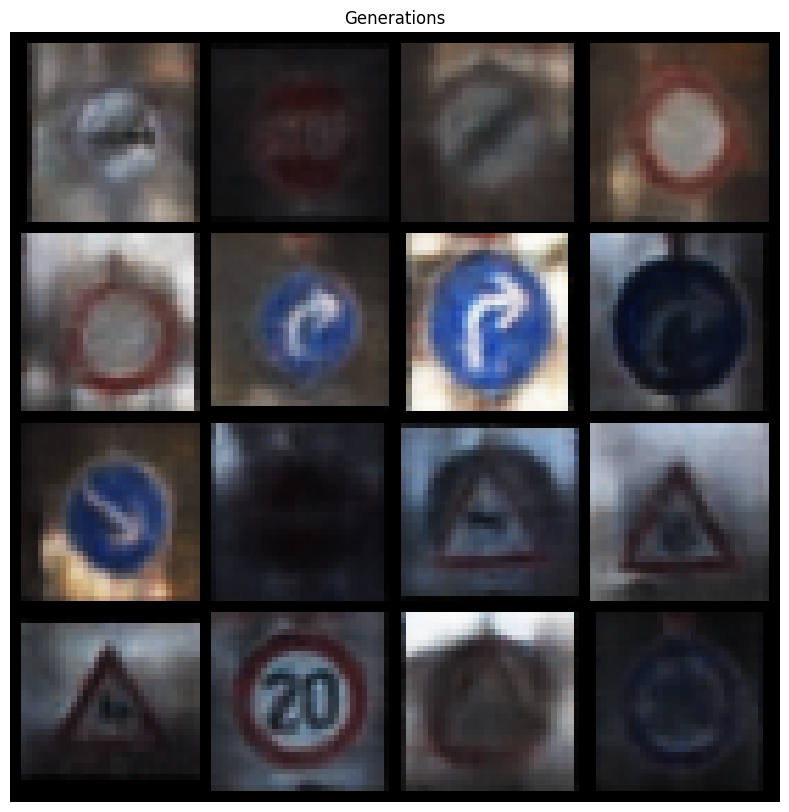

Epoch 71 loss 12964.35097838785, test L1 = 0.09987104765099028
Epoch 72 loss 12951.749698817173, test L1 = 0.10018314988068912
Epoch 73 loss 12908.231495509637, test L1 = 0.10003439531378124
Epoch 74 loss 12884.847505658587, test L1 = 0.1003123915389828
Epoch 75 loss 12873.956040997371, test L1 = 0.0999286518148754


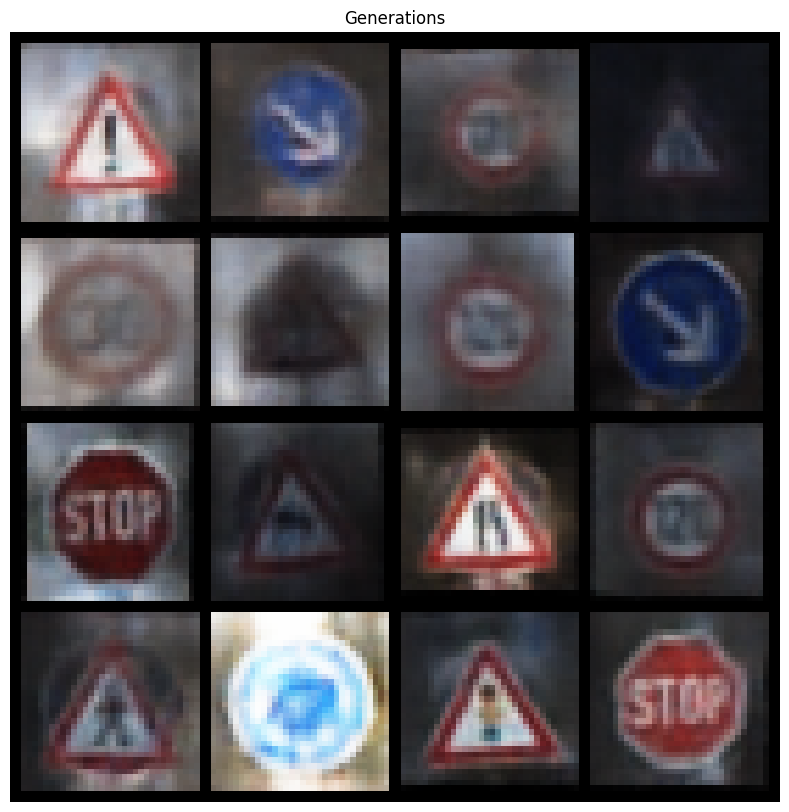

Epoch 76 loss 12850.383697794976, test L1 = 0.100326475403879
Epoch 77 loss 12831.32421875, test L1 = 0.1013652494420176
Epoch 78 loss 12814.266058520736, test L1 = 0.09987381133048431
Epoch 79 loss 12778.828658915012, test L1 = 0.10023050577096317
Epoch 80 loss 12773.08435400847, test L1 = 0.09949852218446524


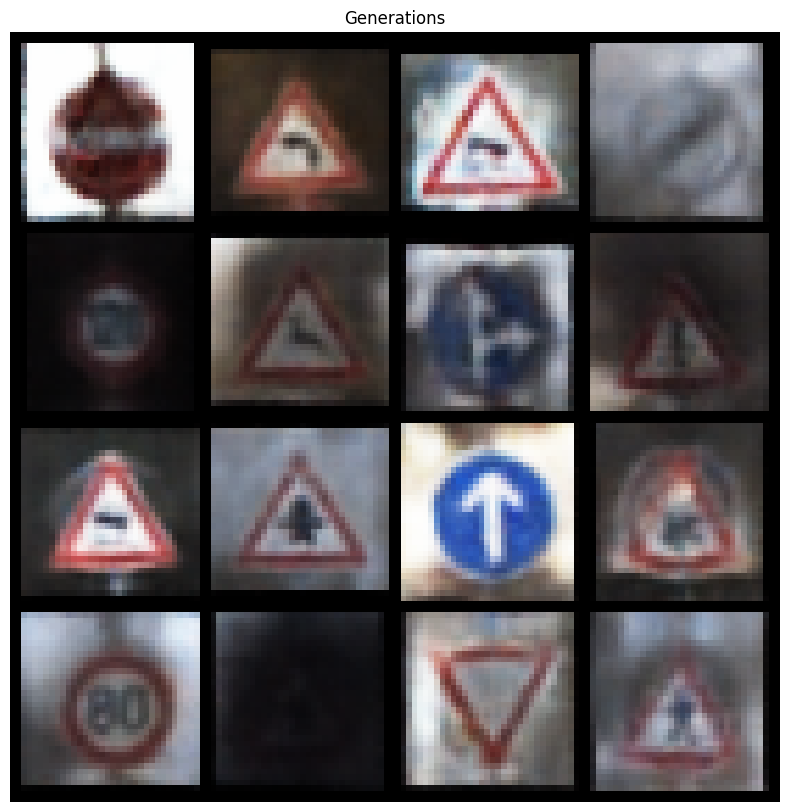

Epoch 81 loss 12748.548348970502, test L1 = 0.0995256507202335
Epoch 82 loss 12720.89685400847, test L1 = 0.09962295449298361
Epoch 83 loss 12702.346159462617, test L1 = 0.09940751496216525
Epoch 84 loss 12696.027403073891, test L1 = 0.0997503680055556
Epoch 85 loss 12660.595223970502, test L1 = 0.09901844288991846


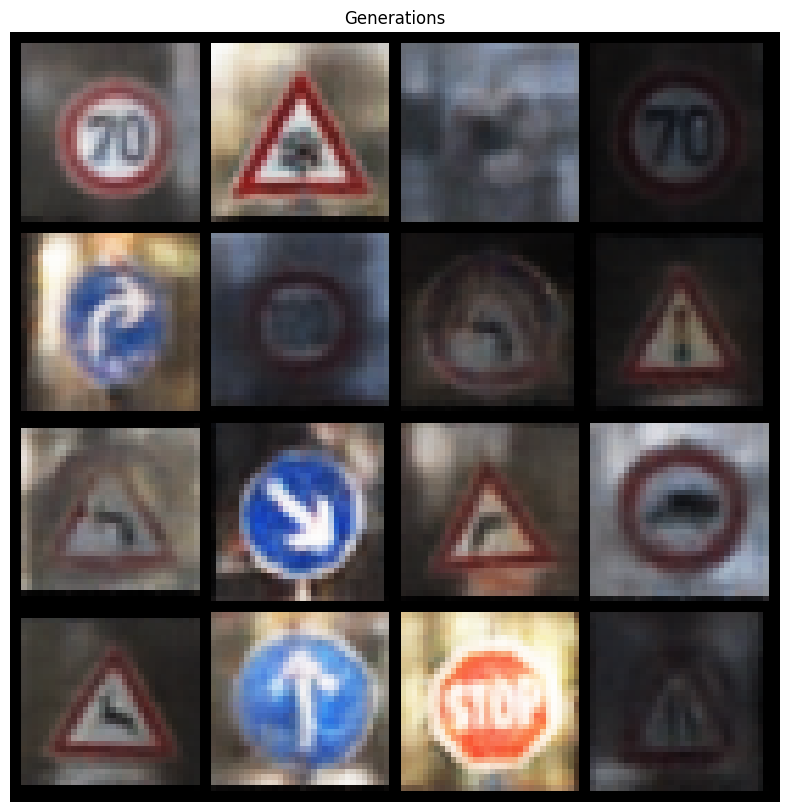

Epoch 86 loss 12640.789235908294, test L1 = 0.09943321266252061
Epoch 87 loss 12624.691018363026, test L1 = 0.09918573563513548
Epoch 88 loss 12597.150399751752, test L1 = 0.09920352049495863
Epoch 89 loss 12590.69002354702, test L1 = 0.09871523260422375
Epoch 90 loss 12576.110789646613, test L1 = 0.09901727865571561


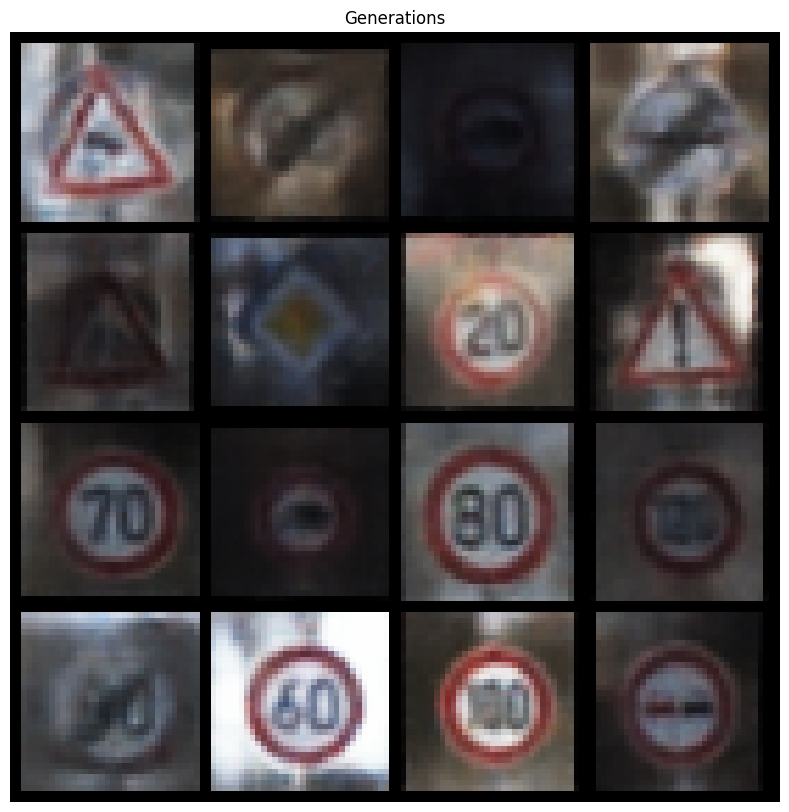

Epoch 91 loss 12563.057471159462, test L1 = 0.09928694027273552
Epoch 92 loss 12543.21023474007, test L1 = 0.09869369313768718
Epoch 93 loss 12528.21275828709, test L1 = 0.09883019133754399
Epoch 94 loss 12505.758446809288, test L1 = 0.09937857123820679
Epoch 95 loss 12489.016939252337, test L1 = 0.09859214123824368


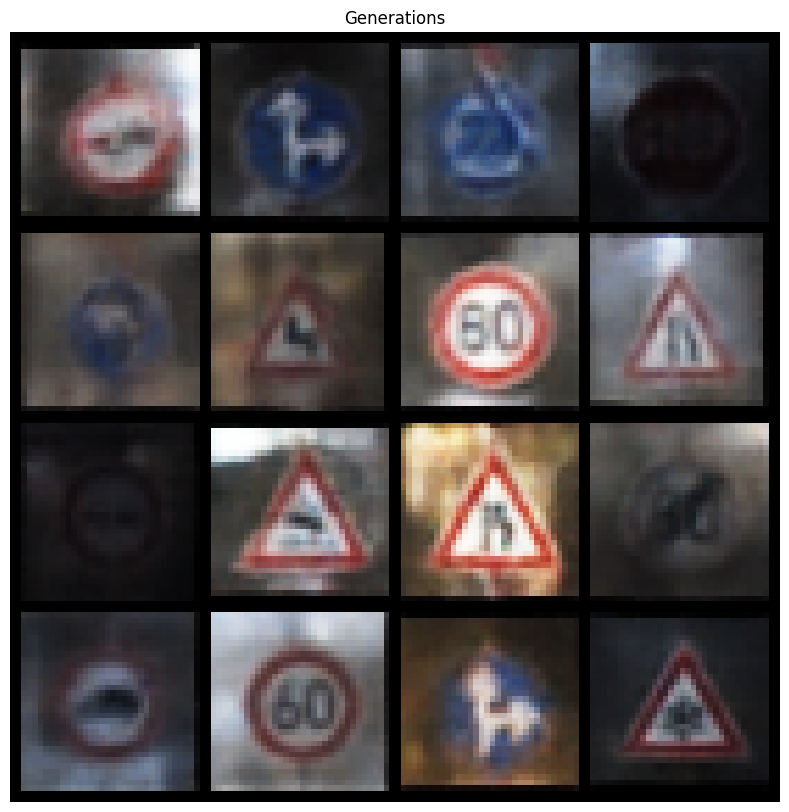

Epoch 96 loss 12484.24905994451, test L1 = 0.0983901553503845
Epoch 97 loss 12455.42993848569, test L1 = 0.09881343400996664
Epoch 98 loss 12448.003910813377, test L1 = 0.0983006222092587
Epoch 99 loss 12434.034553884347, test L1 = 0.09835055211315984
Epoch 100 loss 12428.102835681952, test L1 = 0.09850280926279399


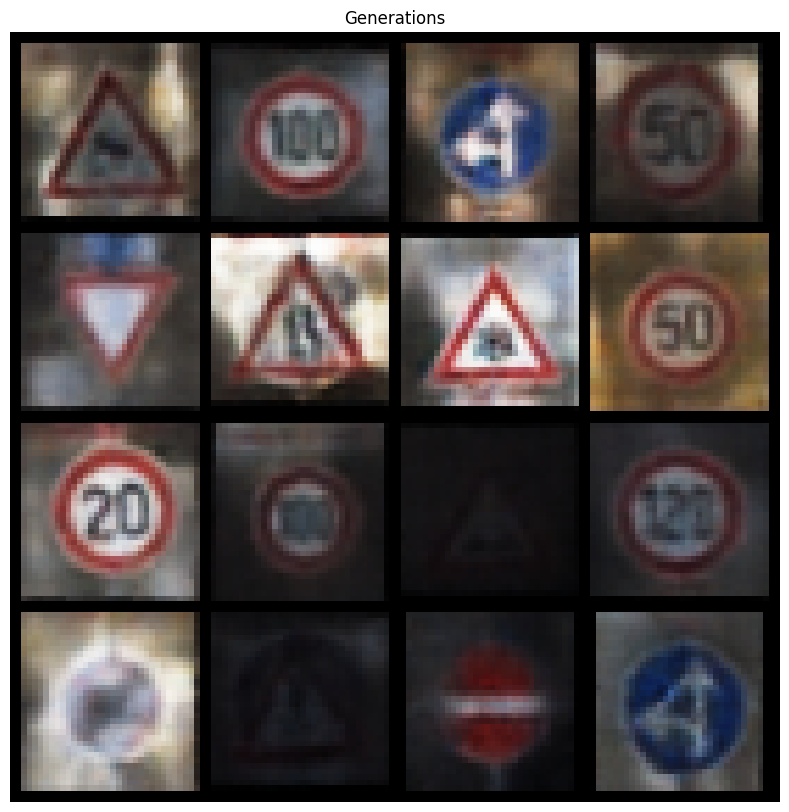

Epoch 101 loss 12413.002660448306, test L1 = 0.09901894920546075
Epoch 102 loss 12379.144987587617, test L1 = 0.09878312974520352
Epoch 103 loss 12362.579119816004, test L1 = 0.09828093615563019
Epoch 104 loss 12360.634770188377, test L1 = 0.09888093529835991
Epoch 105 loss 12341.640725394276, test L1 = 0.09910856932401657


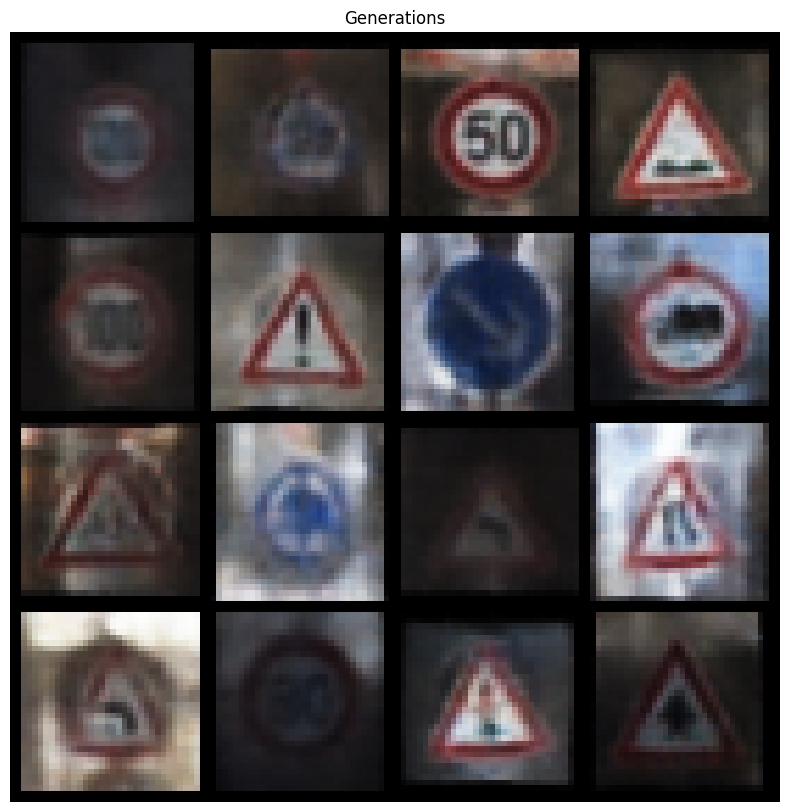

Epoch 106 loss 12327.101831739194, test L1 = 0.09807976157121036
Epoch 107 loss 12315.774637667932, test L1 = 0.09790376832951671
Epoch 108 loss 12300.5018572941, test L1 = 0.09801962971687317
Epoch 109 loss 12289.168037200643, test L1 = 0.09871235214497733
Epoch 110 loss 12278.24210535923, test L1 = 0.09799909008585889


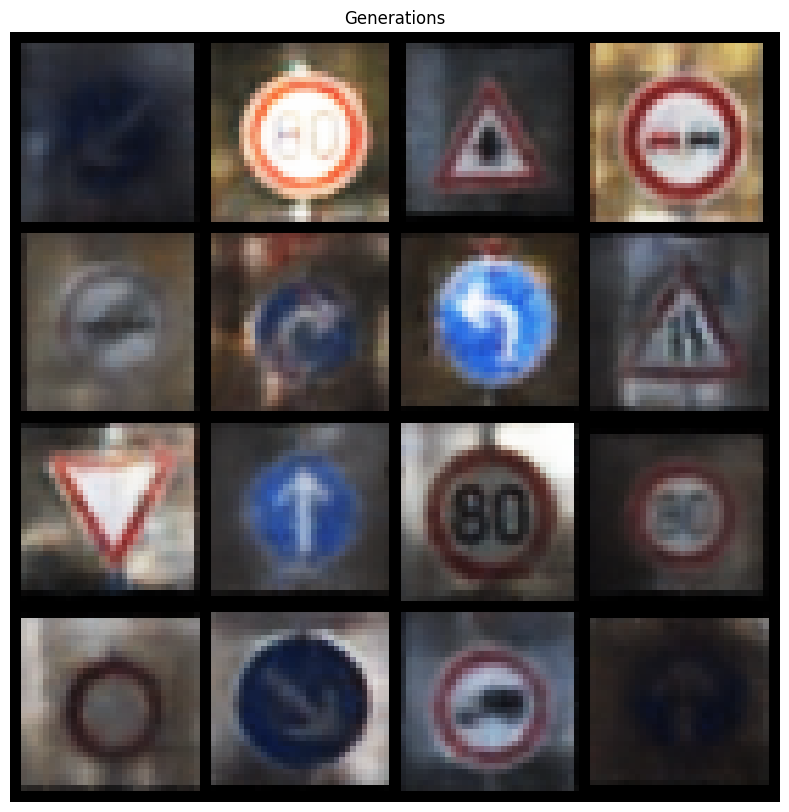

Epoch 111 loss 12265.962489047897, test L1 = 0.0981409517319306
Epoch 112 loss 12252.246778256425, test L1 = 0.09790234818406728
Epoch 113 loss 12243.683100905373, test L1 = 0.09766169297306435
Epoch 114 loss 12222.881817683996, test L1 = 0.09812354717565619
Epoch 115 loss 12216.145621896903, test L1 = 0.09796462078457294


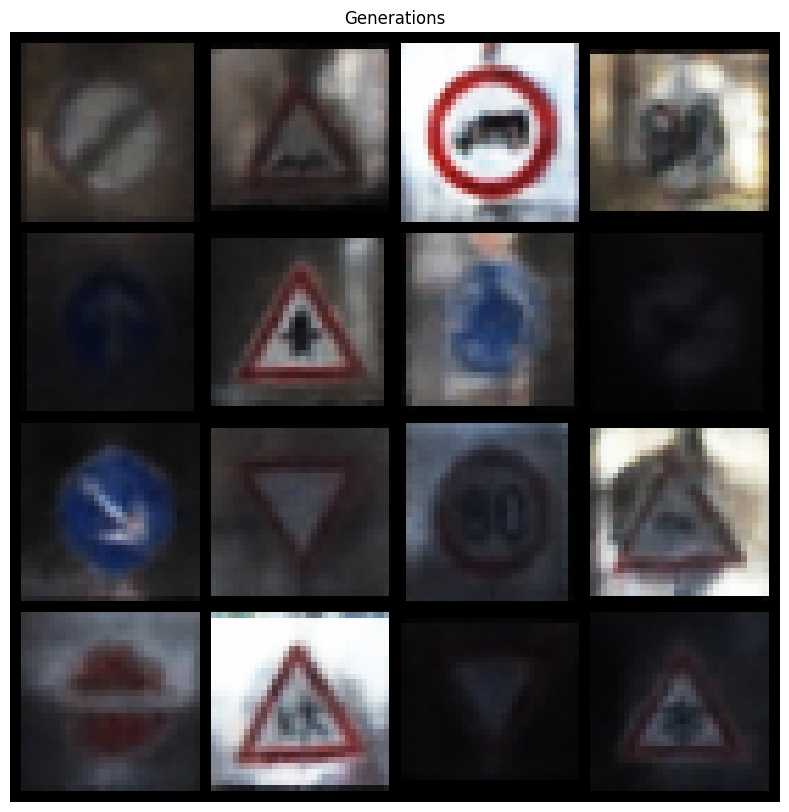

Epoch 116 loss 12199.858663113318, test L1 = 0.09779643461756084
Epoch 117 loss 12199.13144348715, test L1 = 0.09754845321826312
Epoch 118 loss 12179.116265698014, test L1 = 0.09791202826992325
Epoch 119 loss 12166.210704767815, test L1 = 0.097849413914525
Epoch 120 loss 12166.714551693925, test L1 = 0.09789600174712099


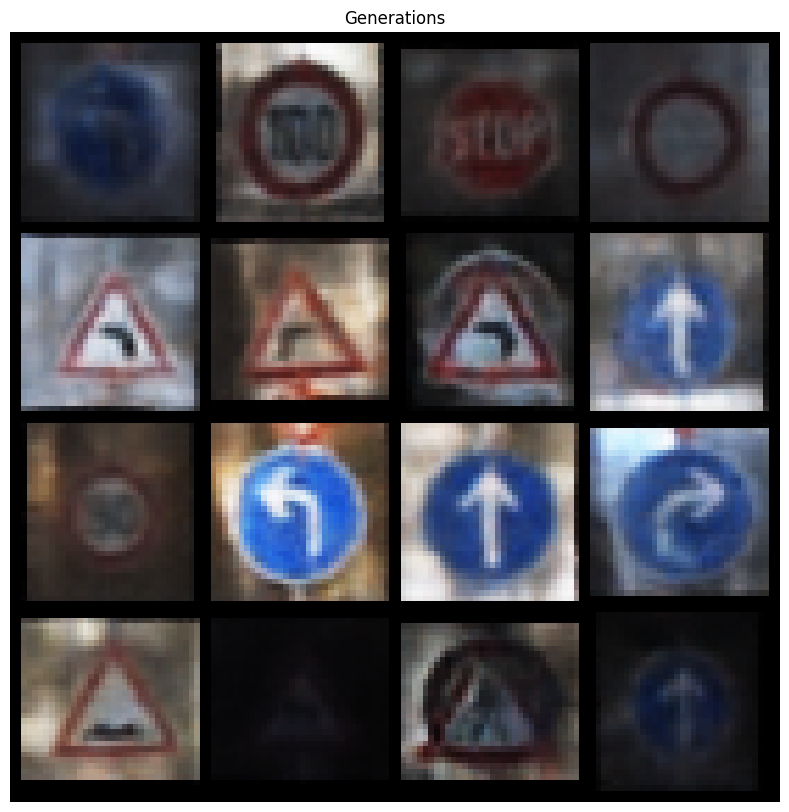

Epoch 121 loss 12144.320654753212, test L1 = 0.09796380105873813
Epoch 122 loss 12132.649048992407, test L1 = 0.09759347545711891
Epoch 123 loss 12123.24080479702, test L1 = 0.09760704345029333
Epoch 124 loss 12105.740553811333, test L1 = 0.09769852524218352
Epoch 125 loss 12096.171815676109, test L1 = 0.09766940319019815


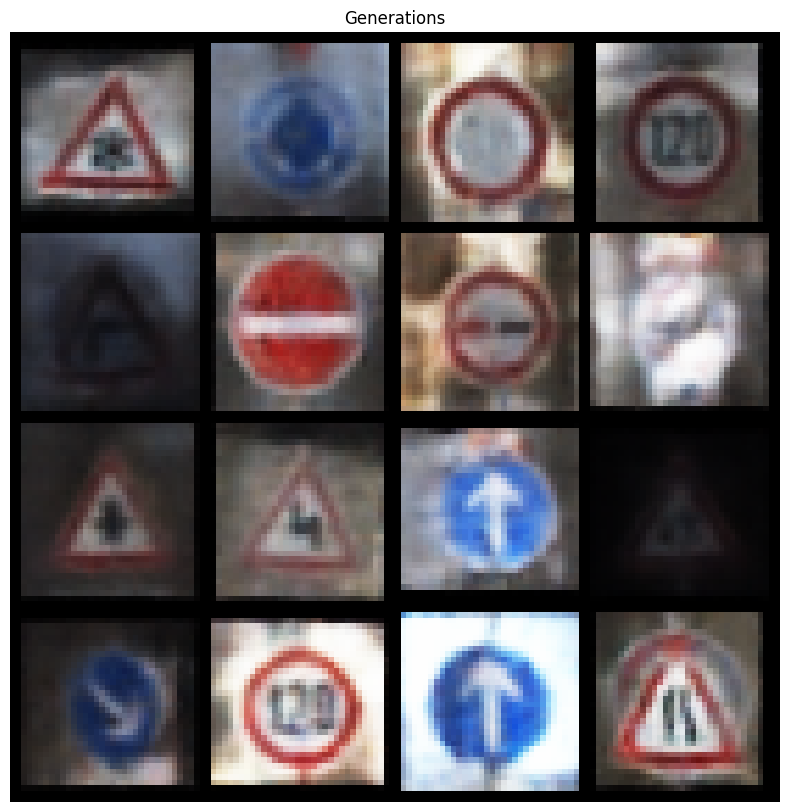

Epoch 126 loss 12086.7413067684, test L1 = 0.09766179485165555
Epoch 127 loss 12075.93763233791, test L1 = 0.09793585603651793
Epoch 128 loss 12066.10558739778, test L1 = 0.09747009044108183
Epoch 129 loss 12048.435889128212, test L1 = 0.09819027975849483
Epoch 130 loss 12036.653019129673, test L1 = 0.09728557681259901


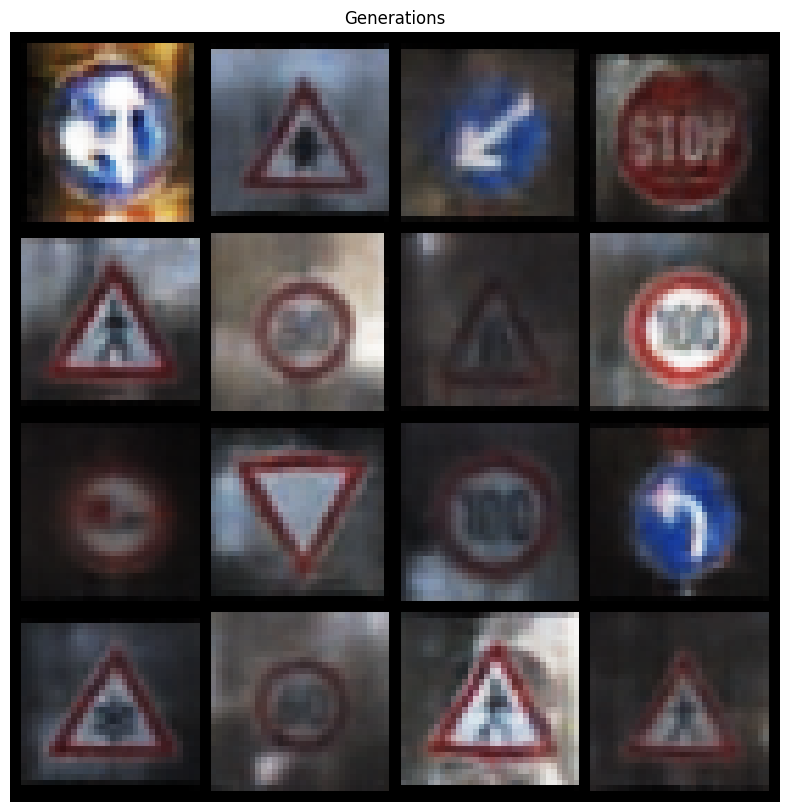

Epoch 131 loss 12040.628860616238, test L1 = 0.09743436101986014
Epoch 132 loss 12017.70644713785, test L1 = 0.09765202179551125
Epoch 133 loss 12003.441926474883, test L1 = 0.0975739476473435
Epoch 134 loss 12002.57837598569, test L1 = 0.09723919905398203
Epoch 135 loss 11991.968731746496, test L1 = 0.0972704291343689


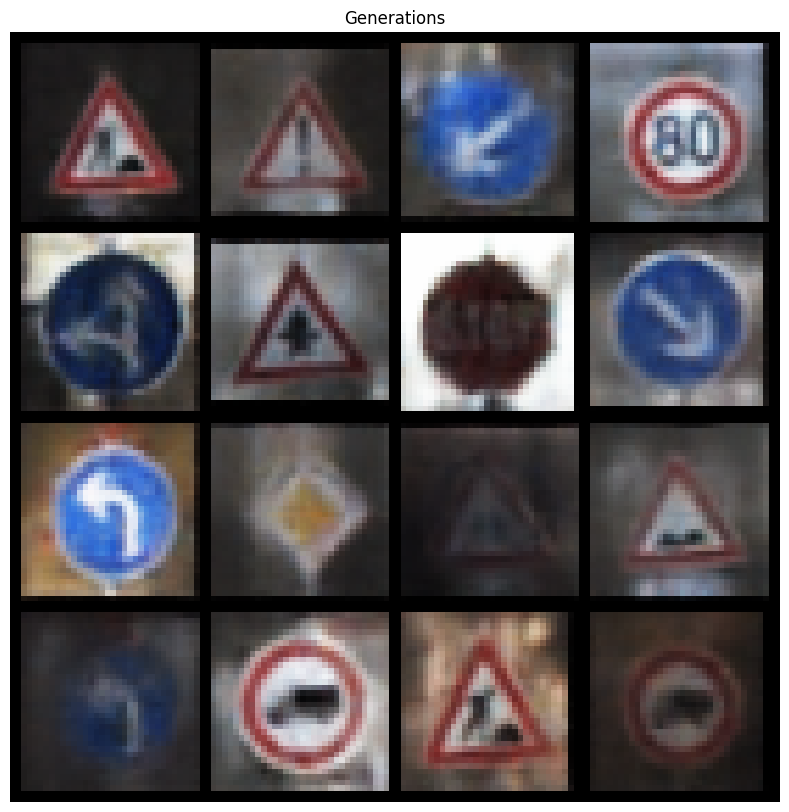

Epoch 136 loss 11978.475722838784, test L1 = 0.09754655121461205
Epoch 137 loss 11981.179482148073, test L1 = 0.09741406256090039
Epoch 138 loss 11961.877564617407, test L1 = 0.09744179167825243
Epoch 139 loss 11943.581812207944, test L1 = 0.09742213332134744
Epoch 140 loss 11945.638325058411, test L1 = 0.09692797194356503


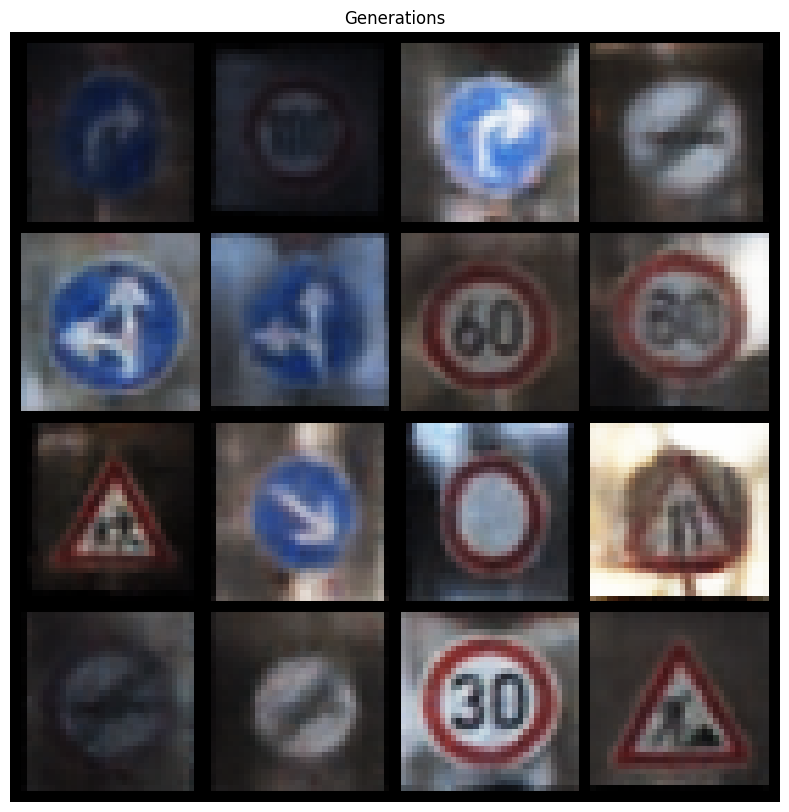

Epoch 141 loss 11937.848838164427, test L1 = 0.0974130436130192
Epoch 142 loss 11926.964305271613, test L1 = 0.09714410826563835
Epoch 143 loss 11916.963118793808, test L1 = 0.09715800003513046
Epoch 144 loss 11911.108827394859, test L1 = 0.09698553529122601
Epoch 145 loss 11906.93578417056, test L1 = 0.09700507881200832


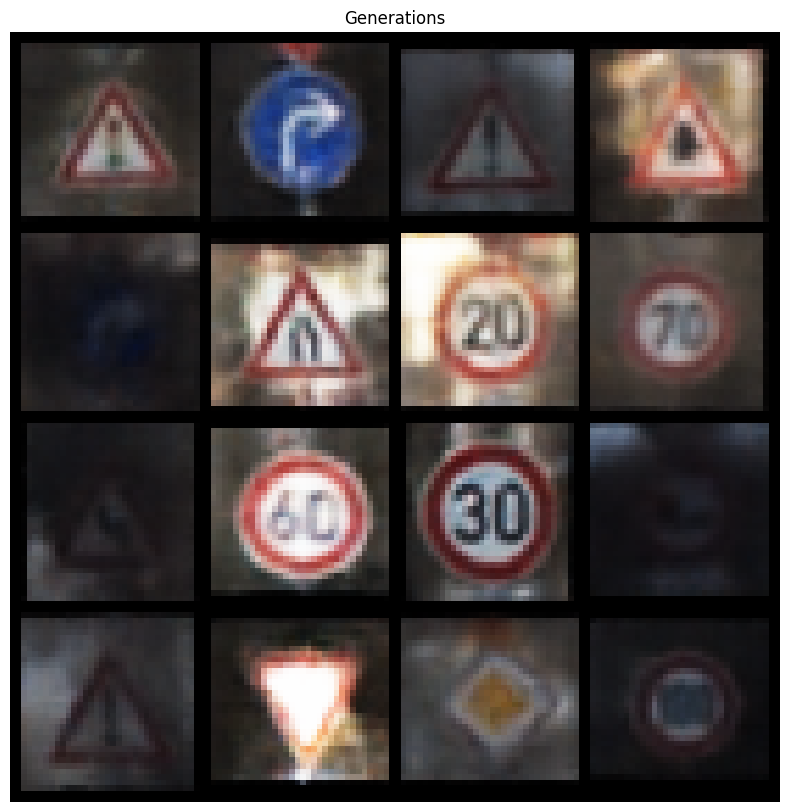

Epoch 146 loss 11890.782276759637, test L1 = 0.09708206177405689
Epoch 147 loss 11879.114778037383, test L1 = 0.09707513095244118
Epoch 148 loss 11885.369587835865, test L1 = 0.09701143755860951
Epoch 149 loss 11856.948488609813, test L1 = 0.09696796261098074
Epoch 150 loss 11847.29283641209, test L1 = 0.09678431535544603


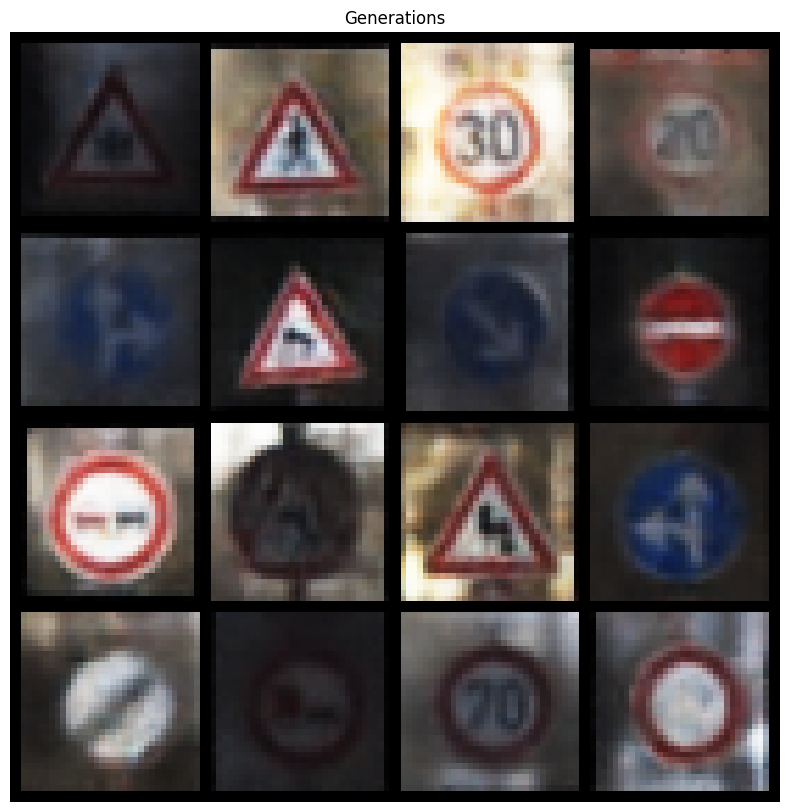

Epoch 151 loss 11861.924147561333, test L1 = 0.09743272756104884
Epoch 152 loss 11841.322525737442, test L1 = 0.09685870130424915
Epoch 153 loss 11829.919086777161, test L1 = 0.0967960963430612
Epoch 154 loss 11834.236268801109, test L1 = 0.0966285667989565
Epoch 155 loss 11820.026504088784, test L1 = 0.09689266752937566


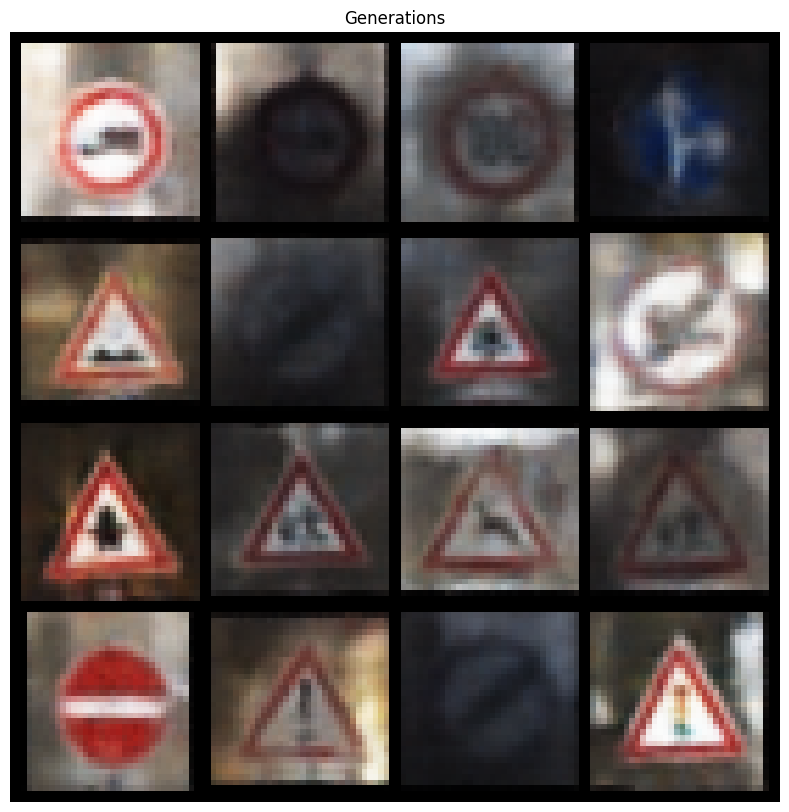

Epoch 156 loss 11819.031199802863, test L1 = 0.096710580036692


KeyboardInterrupt: 

In [40]:
num_epochs = 500

for n in range(num_epochs):
    losses_epoch = []
    for x, y in iter(train_dl):
        x = x.to(device)
        y = y.to(device)
        y = nn.functional.one_hot(y, CLASS_NUMBER)

        out, means, log_var = vae(x, y)
        loss = vae_loss_function(x, out, means, log_var) 
        losses_epoch.append(loss.item())
        loss.backward()               # backward pass (compute parameter updates)
        optimizer.step()              # make the updates for each parameter
        optimizer.zero_grad()  
    L1_list = []

    for x, y in iter(valid_dl):
        x  = x.to(device)
        y = y.to(device)
        y = nn.functional.one_hot(y, CLASS_NUMBER)
        out, _, _ = vae(x, y)
        L1_list.append(torch.mean(torch.abs(out-x)).item())
    print(f"Epoch {n} loss {np.mean(np.array(losses_epoch))}, test L1 = {np.mean(L1_list)}")
    scheduler.step()

    if n % 5 == 0:
        generate_images(vae, 16 , device)

### Now that's better

In [41]:
L1_list = []

for x, y in iter(test_dl):
    x  = x.to(device)
    y = y.to(device)
    y = nn.functional.one_hot(y, CLASS_NUMBER)
    out, _, _ = vae(x, y)
    L1_list.append(torch.mean(torch.abs(out-x)).item())
print(f"The test L1 = {np.mean(L1_list)}")

The test L1 = 0.09675250947475433


### Generating new images

In [ ]:
with torch.no_grad():
    embeds = torch.randn([1000, EMB], ).to(device)
    img_class = torch.randint(0, 43, (1000, 1)).to(device)
    img_class = torch.squeeze(img_class, dim=-1)
    img_class = nn.functional.one_hot(img_class, CLASS_NUMBER)
    generated_imgs = vae.decoder(embeds, img_class)
    generated_imgs = (generated_imgs + 1) / 2
torch.save(generated_imgs.cpu().detach(), "poniedzialek_skiers_zdziech.pt")
print(generated_imgs.shape)